# Phase 4

## Unsupervised ML (Clustering)

Note: This phase requires your general knowledge and thought process to merge the right datasets and the right columns. Collecting quality data is a key factor to create meaningful clusters and Analysis.

Assumption: You were given various crime datasets that contains all the DISTRICTS in each state and you were asked to provide the below data to the higher authorities for further action.



### 4.1  Create 3 clusters as below.

    1. Sensitive Area's

    2. Moderate Area's

    3. Peaceful Area's
    
### 4.2  Create DataFrame for each cluster that shows data according to the areas.

### 4.3  Analyse your clusters and prepare a report that explains all your observations.

    Example - 

    1. What is impacting more crimes in sensitive areas. 

    2. What needs to be done to reduce crime. 
        
    3. Most safe and unsafe districts.

    4. Etc.......Anything that you observe (If you want, you can plot various graphs to analyze)

### 4.4   Capstone project overall story in your own words. Min 1000 words.



# Data cleaning

In [1]:
#Import libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

## District wise crimes committed IPC 2001-2012

In [2]:
# Importing the dataset

df_ipc = pd.read_csv("01_District_wise_crimes_committed_IPC_2001_2012.csv")
df_ipc

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,41,1244,12,109,58,247,0,431,2313,6507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9014,PUDUCHERRY,KARAIKAL,2012,5,6,2,6,0,6,2,...,1,186,0,2,0,1,0,44,392,787
9015,PUDUCHERRY,PUDUCHERRY,2012,24,21,10,7,0,7,17,...,20,632,0,7,2,5,0,219,1668,3494


In [3]:
#Checking the columns of the dataset

df_ipc.columns.to_list()

['STATE/UT',
 'DISTRICT',
 'YEAR',
 'MURDER',
 'ATTEMPT TO MURDER',
 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
 'RAPE',
 'CUSTODIAL RAPE',
 'OTHER RAPE',
 'KIDNAPPING & ABDUCTION',
 'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
 'KIDNAPPING AND ABDUCTION OF OTHERS',
 'DACOITY',
 'PREPARATION AND ASSEMBLY FOR DACOITY',
 'ROBBERY',
 'BURGLARY',
 'THEFT',
 'AUTO THEFT',
 'OTHER THEFT',
 'RIOTS',
 'CRIMINAL BREACH OF TRUST',
 'CHEATING',
 'COUNTERFIETING',
 'ARSON',
 'HURT/GREVIOUS HURT',
 'DOWRY DEATHS',
 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
 'INSULT TO MODESTY OF WOMEN',
 'CRUELTY BY HUSBAND OR HIS RELATIVES',
 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
 'CAUSING DEATH BY NEGLIGENCE',
 'OTHER IPC CRIMES',
 'TOTAL IPC CRIMES']

In [4]:
# Checking for null values

df_ipc.isnull().sum()

STATE/UT                                               0
DISTRICT                                               0
YEAR                                                   0
MURDER                                                 0
ATTEMPT TO MURDER                                      0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              0
RAPE                                                   0
CUSTODIAL RAPE                                         0
OTHER RAPE                                             0
KIDNAPPING & ABDUCTION                                 0
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS            0
KIDNAPPING AND ABDUCTION OF OTHERS                     0
DACOITY                                                0
PREPARATION AND ASSEMBLY FOR DACOITY                   0
ROBBERY                                                0
BURGLARY                                               0
THEFT                                                  0
AUTO THEFT                     

No missing values in the dataset.

<Axes: >

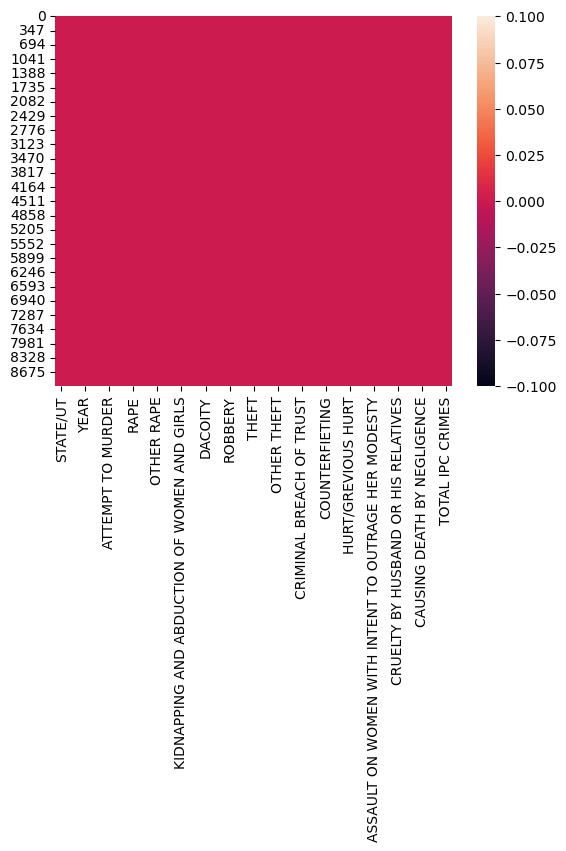

In [5]:
# Using heatmap to visualize the null values.

sns.heatmap(df_ipc.isnull())

In [6]:
# Checking for dublicate values

df_ipc.duplicated().sum()

0

No dublicate values in the dataset.

In [7]:
# Checking the unique values in STATE/UT column

df_ipc['STATE/UT'].unique()

array(['ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR',
       'CHHATTISGARH', 'GOA', 'GUJARAT', 'HARYANA', 'HIMACHAL PRADESH',
       'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA',
       'MADHYA PRADESH', 'MAHARASHTRA', 'MANIPUR', 'MEGHALAYA', 'MIZORAM',
       'NAGALAND', 'ODISHA', 'PUNJAB', 'RAJASTHAN', 'SIKKIM',
       'TAMIL NADU', 'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND',
       'WEST BENGAL', 'A & N ISLANDS', 'CHANDIGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI UT', 'LAKSHADWEEP', 'PUDUCHERRY'],
      dtype=object)

In [8]:
# Checking the unique values in DISTRICT column

df_ipc['DISTRICT'].unique()

array(['ADILABAD', 'ANANTAPUR', 'CHITTOOR', 'CUDDAPAH', 'EAST GODAVARI',
       'GUNTAKAL RLY.', 'GUNTUR', 'HYDERABAD CITY', 'KARIMNAGAR',
       'KHAMMAM', 'KRISHNA', 'KURNOOL', 'MAHABOOBNAGAR', 'MEDAK',
       'NALGONDA', 'NELLORE', 'NIZAMABAD', 'PRAKASHAM', 'RANGA REDDY',
       'SECUNDERABAD RLY.', 'SRIKAKULAM', 'VIJAYAWADA', 'VIJAYAWADA RLY.',
       'VISAKHA RURAL', 'VISAKHAPATNAM', 'VIZIANAGARAM', 'WARANGAL',
       'WEST GODAVARI', 'TOTAL', 'CHANGLANG', 'DIBANG VALLEY',
       'KAMENG EAST', 'KAMENG WEST', 'LOHIT', 'PAPUM PARE', 'SIANG EAST',
       'SIANG UPPER', 'SIANG WEST', 'SUBANSIRI LOWER', 'SUBANSIRI UPPER',
       'TAWANG', 'TIRAP', 'BARPETA', 'BONGAIGAON', 'C.I.D.', 'CACHAR',
       'DARRANG', 'DHEMAJI', 'DHUBRI', 'DIBRUGARH', 'G.R.P.', 'GOALPARA',
       'GOLAGHAT', 'GUWAHATI CITY', 'HAILAKANDI', 'JORHAT', 'KAMRUP',
       'KARBI ANGLONG', 'KARIMGANJ', 'KOKRAJHAR', 'LAKHIMPUR', 'MORIGAON',
       'N.C.HILLS', 'NAGAON', 'NALBARI', 'R.P.O.', 'SIBSAGAR', 'SONITPUR',
    

In [9]:
df_ipc=df_ipc[df_ipc['DISTRICT']!='TOTAL']

In [10]:
# Summation of all crimes

df_ipc['TOTAL IPC CRIMES']=df_ipc.iloc[:,3:].sum(axis=1)

In [11]:
# ipc crimes dataframe

ipc=df_ipc[['STATE/UT','DISTRICT','YEAR','TOTAL IPC CRIMES']]
ipc

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,8603
1,ANDHRA PRADESH,ANANTAPUR,2001,8692
2,ANDHRA PRADESH,CHITTOOR,2001,12445
3,ANDHRA PRADESH,CUDDAPAH,2001,6498
4,ANDHRA PRADESH,EAST GODAVARI,2001,14107
...,...,...,...,...
9010,DELHI UT,STF,2012,12
9011,DELHI UT,WEST,2012,14001
9012,LAKSHADWEEP,LAKSHADWEEP,2012,127
9014,PUDUCHERRY,KARAIKAL,2012,1663


## District wise crimes committed against ST 2001-2012

In [12]:
# Importing the dataset

df_st = pd.read_csv("02_District_wise_crimes_committed_against_ST_2001_2012.csv")

df_st

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs
0,ANDHRA PRADESH,ADILABAD,2001,0,1,2,0,0,0,2,0,0,13
1,ANDHRA PRADESH,ANANTAPUR,2001,0,0,0,0,0,0,7,0,1,6
2,ANDHRA PRADESH,CHITTOOR,2001,0,0,0,0,0,0,2,0,0,0
3,ANDHRA PRADESH,CUDDAPAH,2001,0,0,0,0,0,0,2,0,2,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,0,0,0,0,0,0,0,0,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9013,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,0,0
9014,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,0,0,0
9015,PUDUCHERRY,KARAIKAL,2012,0,0,0,0,0,0,0,0,0,0
9016,PUDUCHERRY,PUDUCHERRY,2012,0,0,0,0,0,0,0,0,0,0


In [13]:
#Checking the columns of the dataset

df_st.columns.to_list()

['STATE/UT',
 'DISTRICT',
 'Year',
 'Murder',
 'Rape',
 'Kidnapping Abduction',
 'Dacoity',
 'Robbery',
 'Arson',
 'Hurt',
 'Protection of Civil Rights (PCR) Act',
 'Prevention of atrocities (POA) Act',
 'Other Crimes Against STs']

In [14]:
# Checking for null values

df_st.isnull().sum()

STATE/UT                                0
DISTRICT                                0
Year                                    0
Murder                                  0
Rape                                    0
Kidnapping Abduction                    0
Dacoity                                 0
Robbery                                 0
Arson                                   0
Hurt                                    0
Protection of Civil Rights (PCR) Act    0
Prevention of atrocities (POA) Act      0
Other Crimes Against STs                0
dtype: int64

No missing values in the dataset.

<Axes: >

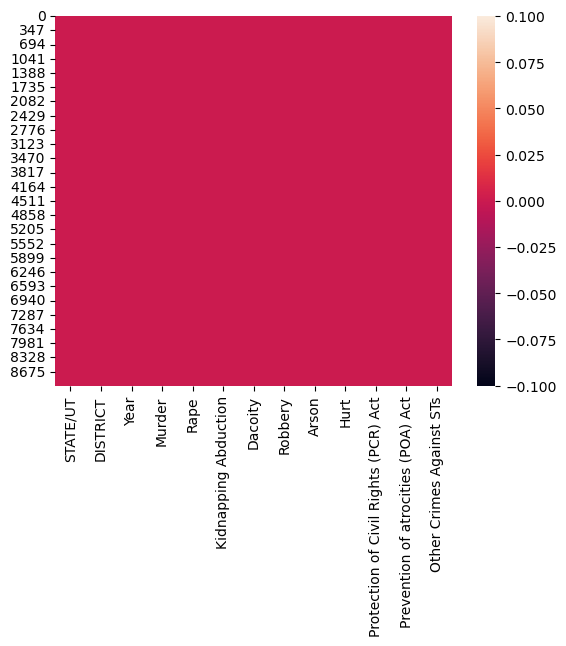

In [15]:
# Using heatmap to visualize the null values.

sns.heatmap(df_st.isnull())

In [16]:
# Checking for dublicate values

df_st.duplicated().sum()

2

2 dublicates value in the dataset.

In [17]:
# Droppin the duplicated values

df_st.drop_duplicates(keep = 'first', inplace = True)

In [18]:
# Checking the unique values in STATE/UT column

df_st['STATE/UT'].unique()

array(['ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR',
       'CHHATTISGARH', 'GOA', 'GUJARAT', 'HARYANA', 'HIMACHAL PRADESH',
       'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA',
       'MADHYA PRADESH', 'MAHARASHTRA', 'MANIPUR', 'MEGHALAYA', 'MIZORAM',
       'NAGALAND', 'ODISHA', 'PUNJAB', 'RAJASTHAN', 'SIKKIM',
       'TAMIL NADU', 'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND',
       'WEST BENGAL', 'A & N ISLANDS', 'CHANDIGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI', 'LAKSHADWEEP', 'PUDUCHERRY'], dtype=object)

In [19]:
# Checking the unique values in DISTRICT column

df_st['DISTRICT'].unique()

array(['ADILABAD', 'ANANTAPUR', 'CHITTOOR', 'CUDDAPAH', 'EAST GODAVARI',
       'GUNTAKAL RLY.', 'GUNTUR', 'HYDERABAD CITY', 'KARIMNAGAR',
       'KHAMMAM', 'KRISHNA', 'KURNOOL', 'MAHABOOBNAGAR', 'MEDAK',
       'NALGONDA', 'NELLORE', 'NIZAMABAD', 'PRAKASHAM', 'RANGA REDDY',
       'SECUNDERABAD RLY.', 'SRIKAKULAM', 'VIJAYAWADA', 'VIJAYAWADA RLY.',
       'VISAKHA RURAL', 'VISAKHAPATNAM', 'VIZIANAGARAM', 'WARANGAL',
       'WEST GODAVARI', 'TOTAL', 'CHANGLANG', 'DIBANG VALLEY',
       'KAMENG EAST', 'KAMENG WEST', 'LOHIT', 'PAPUM PARE', 'SIANG EAST',
       'SIANG UPPER', 'SIANG WEST', 'SUBANSIRI LOWER', 'SUBANSIRI UPPER',
       'TAWANG', 'TIRAP', 'BARPETA', 'BONGAIGAON', 'C.I.D.', 'CACHAR',
       'DARRANG', 'DHEMAJI', 'DHUBRI', 'DIBRUGARH', 'G.R.P.', 'GOALPARA',
       'GOLAGHAT', 'GUWAHATI CITY', 'HAILAKANDI', 'JORHAT', 'KAMRUP',
       'KARBI ANGLONG', 'KARIMGANJ', 'KOKRAJHAR', 'LAKHIMPUR', 'MORIGAON',
       'N.C. HILLS', 'NAGAON', 'NALBARI', 'R.P.O.', 'SIBSAGAR',
       'SONITPU

In [20]:
df_st=df_st[df_st['DISTRICT']!='TOTAL']

In [21]:
# Renaming Year column

df_st.rename(columns={'Year':'YEAR'},inplace =True)

In [22]:
# Summation of all crimes

df_st['TOTAL CRIMES AGAINST ST']=df_st.iloc[:,3:].sum(axis=1)

In [23]:
# ST crimes dataframe

st=df_st[['STATE/UT','DISTRICT','YEAR','TOTAL CRIMES AGAINST ST']]
st

,STATE/UT,DISTRICT,YEAR,TOTAL CRIMES AGAINST ST
0,ANDHRA PRADESH,ADILABAD,2001,18
1,ANDHRA PRADESH,ANANTAPUR,2001,14
2,ANDHRA PRADESH,CHITTOOR,2001,2
3,ANDHRA PRADESH,CUDDAPAH,2001,4
4,ANDHRA PRADESH,EAST GODAVARI,2001,14
...,...,...,...,...
9010,DELHI,STF,2012,0
9011,DELHI,WEST,2012,0
9013,LAKSHADWEEP,LAKSHADWEEP,2012,0
9015,PUDUCHERRY,KARAIKAL,2012,0


## District wise crimes committed against SC 2001-2012

In [24]:
# Importing the dataset

df_sc = pd.read_csv('02_01_District_wise_crimes_committed_against_SC_2001_2012.csv')
df_sc

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs
0,ANDHRA PRADESH,ADILABAD,2001,0,1,4,0,0,0,3,0,15,32
1,ANDHRA PRADESH,ANANTAPUR,2001,0,4,0,0,0,0,49,21,0,53
2,ANDHRA PRADESH,CHITTOOR,2001,3,3,0,0,0,0,38,36,0,34
3,ANDHRA PRADESH,CUDDAPAH,2001,0,3,0,0,0,0,20,52,0,25
4,ANDHRA PRADESH,EAST GODAVARI,2001,1,3,0,0,0,0,3,12,63,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9013,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,0,0
9014,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,0,0,0
9015,PUDUCHERRY,KARAIKAL,2012,1,0,0,0,0,0,0,0,0,0
9016,PUDUCHERRY,PUDUCHERRY,2012,1,0,0,0,0,0,0,1,20,1


In [25]:
#Checking the columns of the dataset

df_sc.columns.to_list()

['STATE/UT',
 'DISTRICT',
 'Year',
 'Murder',
 'Rape',
 'Kidnapping and Abduction',
 'Dacoity',
 'Robbery',
 'Arson',
 'Hurt',
 'Prevention of atrocities (POA) Act',
 'Protection of Civil Rights (PCR) Act',
 'Other Crimes Against SCs']

In [26]:
# Checking for null values

df_sc.isnull().sum()

STATE/UT                                0
DISTRICT                                0
Year                                    0
Murder                                  0
Rape                                    0
Kidnapping and Abduction                0
Dacoity                                 0
Robbery                                 0
Arson                                   0
Hurt                                    0
Prevention of atrocities (POA) Act      0
Protection of Civil Rights (PCR) Act    0
Other Crimes Against SCs                0
dtype: int64

No missing values in the dataset.

In [27]:
# Checking for dublicate values

df_sc.duplicated().sum()

2

There is 2 dublicate values in the dataset.

In [28]:
# Droppin the duplicated values

df_sc.drop_duplicates(keep = 'first', inplace = True)

In [29]:
# Checking the unique values in STATE/UT column

df_sc['STATE/UT'].unique()

array(['ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR',
       'CHHATTISGARH', 'GOA', 'GUJARAT', 'HARYANA', 'HIMACHAL PRADESH',
       'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA',
       'MADHYA PRADESH', 'MAHARASHTRA', 'MANIPUR', 'MEGHALAYA', 'MIZORAM',
       'NAGALAND', 'ODISHA', 'PUNJAB', 'RAJASTHAN', 'SIKKIM',
       'TAMIL NADU', 'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND',
       'WEST BENGAL', 'A & N ISLANDS', 'CHANDIGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI', 'LAKSHADWEEP', 'PUDUCHERRY'], dtype=object)

In [30]:
# Checking the unique values in DISTRICT column

df_sc['DISTRICT'].unique()

array(['ADILABAD', 'ANANTAPUR', 'CHITTOOR', 'CUDDAPAH', 'EAST GODAVARI',
       'GUNTAKAL RLY.', 'GUNTUR', 'HYDERABAD CITY', 'KARIMNAGAR',
       'KHAMMAM', 'KRISHNA', 'KURNOOL', 'MAHABOOBNAGAR', 'MEDAK',
       'NALGONDA', 'NELLORE', 'NIZAMABAD', 'PRAKASHAM', 'RANGA REDDY',
       'SECUNDERABAD RLY.', 'SRIKAKULAM', 'VIJAYAWADA', 'VIJAYAWADA RLY.',
       'VISAKHA RURAL', 'VISAKHAPATNAM', 'VIZIANAGARAM', 'WARANGAL',
       'WEST GODAVARI', 'TOTAL', 'CHANGLANG', 'DIBANG VALLEY',
       'KAMENG EAST', 'KAMENG WEST', 'LOHIT', 'PAPUM PARE', 'SIANG EAST',
       'SIANG UPPER', 'SIANG WEST', 'SUBANSIRI LOWER', 'SUBANSIRI UPPER',
       'TAWANG', 'TIRAP', 'BARPETA', 'BONGAIGAON', 'C.I.D.', 'CACHAR',
       'DARRANG', 'DHEMAJI', 'DHUBRI', 'DIBRUGARH', 'G.R.P.', 'GOALPARA',
       'GOLAGHAT', 'GUWAHATI CITY', 'HAILAKANDI', 'JORHAT', 'KAMRUP',
       'KARBI ANGLONG', 'KARIMGANJ', 'KOKRAJHAR', 'LAKHIMPUR', 'MORIGAON',
       'N.C. HILLS', 'NAGAON', 'NALBARI', 'R.P.O.', 'SIBSAGAR',
       'SONITPU

In [31]:
df_sc=df_sc[df_sc['DISTRICT']!='TOTAL']

In [32]:
# Renaming Year column

df_sc.rename(columns={'Year':'YEAR'},inplace =True)

In [33]:
# Sumation of all crimes

df_sc['TOTAL CRIMES AGAINST SC']=df_sc.iloc[:,3:].sum(axis=1)

In [34]:
# SC crimes dataframe

sc=df_sc[['STATE/UT','DISTRICT','YEAR','TOTAL CRIMES AGAINST SC']]
sc

,STATE/UT,DISTRICT,YEAR,TOTAL CRIMES AGAINST SC
0,ANDHRA PRADESH,ADILABAD,2001,55
1,ANDHRA PRADESH,ANANTAPUR,2001,127
2,ANDHRA PRADESH,CHITTOOR,2001,114
3,ANDHRA PRADESH,CUDDAPAH,2001,100
4,ANDHRA PRADESH,EAST GODAVARI,2001,89
...,...,...,...,...
9010,DELHI,STF,2012,0
9011,DELHI,WEST,2012,2
9013,LAKSHADWEEP,LAKSHADWEEP,2012,0
9015,PUDUCHERRY,KARAIKAL,2012,1


## District wise crimes committed against children 2001-2012

In [35]:
# Importing the dataset

df_children = pd.read_csv('03_District_wise_crimes_committed_against_children_2001_2012.csv')

df_children

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping and Abduction,Foeticide,Abetment of suicide,Exposure and abandonment,Procuration of minor girls,Buying of girls for prostitution,Selling of girls for prostitution,Prohibition of child marriage act,Other Crimes,Total
0,ANDHRA PRADESH,ADILABAD,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,ANDHRA PRADESH,ANANTAPUR,2001,19.0,12.0,29.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,66
2,ANDHRA PRADESH,CHITTOOR,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,ANDHRA PRADESH,CUDDAPAH,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9010,LAKSHADWEEP,LAKSHADWEEP,2012,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
9011,LAKSHADWEEP,TOTAL,2012,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
9012,PUDUCHERRY,KARAIKAL,2012,0.0,3.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,7
9013,PUDUCHERRY,PUDUCHERRY,2012,0.0,4.0,16.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,2.0,25


In [36]:
#Checking the columns of the dataset

df_children.columns.to_list()

['STATE/UT',
 'DISTRICT',
 'Year',
 'Murder',
 'Rape',
 'Kidnapping and Abduction',
 'Foeticide',
 'Abetment of suicide',
 'Exposure and abandonment',
 'Procuration of minor girls',
 'Buying of girls for prostitution',
 'Selling of girls for prostitution',
 'Prohibition of child marriage act',
 'Other Crimes',
 'Total']

In [37]:
# Checking for null values

df_children.isnull().sum()

STATE/UT                              0
DISTRICT                              0
Year                                  0
Murder                               11
Rape                                 11
Kidnapping and Abduction             11
Foeticide                            11
Abetment of suicide                  11
Exposure and abandonment             11
Procuration of minor girls           11
Buying of girls for prostitution     11
Selling of girls for prostitution    11
Prohibition of child marriage act    11
Other Crimes                         11
Total                                 0
dtype: int64

There is missing data in the dataset.

<Axes: >

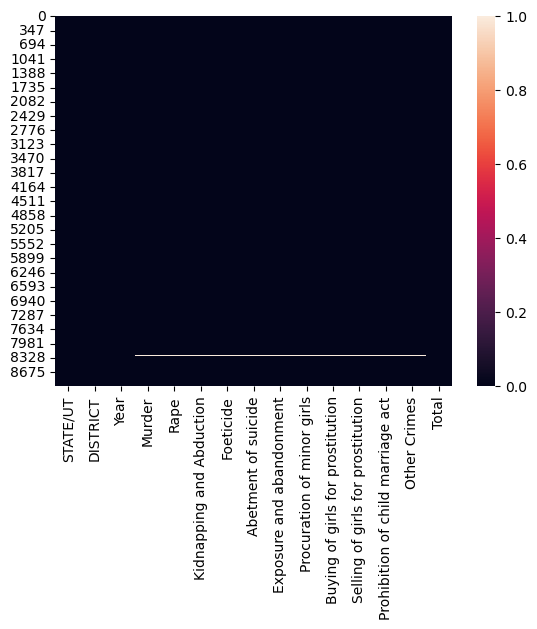

In [38]:
# Using heatmap to visualize the null values.

sns.heatmap(df_children.isnull())

In [39]:
# Filling the missing data with the mean

df_children['Mureder'] = df_children['Murder'].fillna(df_children['Murder'].mean())
df_children['Rape'] = df_children['Rape'].fillna(df_children['Rape'].mean())
df_children['Kidnapping and Abduction'] = df_children['Kidnapping and Abduction'].fillna(df_children['Kidnapping and Abduction'].mean())
df_children['Foeticide'] = df_children['Foeticide'].fillna(df_children['Foeticide'].mean())
df_children['Abetment of suicide'] = df_children['Abetment of suicide'].fillna(df_children['Abetment of suicide'].mean())
df_children['Exposure and abandonment'] = df_children['Exposure and abandonment'].fillna(df_children['Exposure and abandonment'].mean())
df_children['Procuration of minor girls'] = df_children['Procuration of minor girls'].fillna(df_children['Procuration of minor girls'].mean())
df_children['Buying of girls for prostitution'] = df_children['Buying of girls for prostitution'].fillna(df_children['Buying of girls for prostitution'].mean())
df_children['Selling of girls for prostitution'] = df_children['Selling of girls for prostitution'].fillna(df_children['Selling of girls for prostitution'].mean())
df_children['Prohibition of child marriage act'] = df_children['Prohibition of child marriage act'].fillna(df_children['Prohibition of child marriage act'].mean())
df_children['Other Crimes'] = df_children['Other Crimes'].fillna(df_children['Other Crimes'].mean())

In [40]:
# Checking for dublicate values

df_children.duplicated().sum()

1

1 dublicate value.

In [41]:
# Droppin the duplicated values

df_children.drop_duplicates(keep = 'first', inplace = True)

In [42]:
# Checking the unique values in STATE/UT column

df_children['STATE/UT'].unique()

array(['ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR',
       'CHHATTISGARH', 'GOA', 'GUJARAT', 'HARYANA', 'HIMACHAL PRADESH',
       'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA',
       'MADHYA PRADESH', 'MAHARASHTRA', 'MANIPUR', 'MEGHALAYA', 'MIZORAM',
       'NAGALAND', 'ODISHA', 'PUNJAB', 'RAJASTHAN', 'SIKKIM',
       'TAMIL NADU', 'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND',
       'WEST BENGAL', 'A & N ISLANDS', 'CHANDIGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI', 'LAKSHADWEEP', 'PUDUCHERRY'], dtype=object)

In [43]:
# Checking the unique values in DISTRICT column

df_children['DISTRICT'].unique()

array(['ADILABAD', 'ANANTAPUR', 'CHITTOOR', 'CUDDAPAH', 'EAST GODAVARI',
       'GUNTAKAL RLY.', 'GUNTUR', 'HYDERABAD CITY', 'KARIMNAGAR',
       'KHAMMAM', 'KRISHNA', 'KURNOOL', 'MAHABOOBNAGAR', 'MEDAK',
       'NALGONDA', 'NELLORE', 'NIZAMABAD', 'PRAKASHAM', 'RANGA REDDY',
       'SECUNDERABAD RLY.', 'SRIKAKULAM', 'VIJAYAWADA', 'VIJAYAWADA RLY.',
       'VISAKHA RURAL', 'VISAKHAPATNAM', 'VIZIANAGARAM', 'WARANGAL',
       'WEST GODAVARI', 'TOTAL', 'CHANGLANG', 'DIBANG VALLEY',
       'KAMENG EAST', 'KAMENG WEST', 'LOHIT', 'PAPUM PARE', 'SIANG EAST',
       'SIANG UPPER', 'SIANG WEST', 'SUBANSIRI LOWER', 'SUBANSIRI UPPER',
       'TAWANG', 'TIRAP', 'BARPETA', 'BONGAIGAON', 'C.I.D.', 'CACHAR',
       'DARRANG', 'DHEMAJI', 'DHUBRI', 'DIBRUGARH', 'G.R.P.', 'GOALPARA',
       'GOLAGHAT', 'GUWAHATI CITY', 'HAILAKANDI', 'JORHAT', 'KAMRUP',
       'KARBI ANGLONG', 'KARIMGANJ', 'KOKRAJHAR', 'LAKHIMPUR', 'MORIGAON',
       'N.C. HILLS', 'NAGAON', 'NALBARI', 'R.P.O.', 'SIBSAGAR',
       'SONITPU

In [44]:
df_children=df_children[df_children['DISTRICT']!='TOTAL']

In [45]:
# Renaming Year column

df_children.rename(columns={'Year':'YEAR'},inplace =True)

In [46]:
# The Total column is summation of all crimes. We rename it.

df_children.rename(columns={'Total':'TOTAL CRIMES AGAINST CHILDREN'},inplace =True)

In [47]:
# Children crimes dataframe

children=df_children[['STATE/UT','DISTRICT','YEAR', 'TOTAL CRIMES AGAINST CHILDREN']]
children

,STATE/UT,DISTRICT,YEAR,TOTAL CRIMES AGAINST CHILDREN
0,ANDHRA PRADESH,ADILABAD,2001,0
1,ANDHRA PRADESH,ANANTAPUR,2001,66
2,ANDHRA PRADESH,CHITTOOR,2001,0
3,ANDHRA PRADESH,CUDDAPAH,2001,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,0
...,...,...,...,...
9007,DELHI,STF,2012,0
9008,DELHI,WEST,2012,542
9010,LAKSHADWEEP,LAKSHADWEEP,2012,0
9012,PUDUCHERRY,KARAIKAL,2012,7


## District wise crimes committed against women 2001-2012

In [48]:
# Importing the dataset

df_women = pd.read_csv('42_District_wise_crimes_committed_against_women_2001_2012.csv')
df_women

,STATE/UT,DISTRICT,Year,Rape,Kidnapping and Abduction,Dowry Deaths,Assault on women with intent to outrage her modesty,Insult to modesty of Women,Cruelty by Husband or his Relatives,Importation of Girls
0,ANDHRA PRADESH,ADILABAD,2001,50,30,16,149,34,175,0
1,ANDHRA PRADESH,ANANTAPUR,2001,23,30,7,118,24,154,0
2,ANDHRA PRADESH,CHITTOOR,2001,27,34,14,112,83,186,0
3,ANDHRA PRADESH,CUDDAPAH,2001,20,20,17,126,38,57,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,23,26,12,109,58,247,0
...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,1,0,1,0
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,1,0,1,0
9014,PUDUCHERRY,KARAIKAL,2012,6,2,0,2,0,1,0
9015,PUDUCHERRY,PUDUCHERRY,2012,7,14,0,7,2,5,0


In [49]:
#Checking the columns of the dataset

df_women.columns.to_list()

['STATE/UT',
 'DISTRICT',
 'Year',
 'Rape',
 'Kidnapping and Abduction',
 'Dowry Deaths',
 'Assault on women with intent to outrage her modesty',
 'Insult to modesty of Women',
 'Cruelty by Husband or his Relatives',
 'Importation of Girls']

In [50]:
# Checking for null values

df_women.isnull().sum()

STATE/UT                                               0
DISTRICT                                               0
Year                                                   0
Rape                                                   0
Kidnapping and Abduction                               0
Dowry Deaths                                           0
Assault on women with intent to outrage her modesty    0
Insult to modesty of Women                             0
Cruelty by Husband or his Relatives                    0
Importation of Girls                                   0
dtype: int64

No missing values in the datset.

In [51]:
# Checking for dublicate values

df_women.duplicated().sum()

0

No dublicate values in the dataset.

In [52]:
# Checking the unique values in STATE/UT column

df_women['STATE/UT'].unique()

array(['ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM', 'BIHAR',
       'CHHATTISGARH', 'GOA', 'GUJARAT', 'HARYANA', 'HIMACHAL PRADESH',
       'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA', 'KERALA',
       'MADHYA PRADESH', 'MAHARASHTRA', 'MANIPUR', 'MEGHALAYA', 'MIZORAM',
       'NAGALAND', 'ODISHA', 'PUNJAB', 'RAJASTHAN', 'SIKKIM',
       'TAMIL NADU', 'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND',
       'WEST BENGAL', 'A & N ISLANDS', 'CHANDIGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI', 'LAKSHADWEEP', 'PUDUCHERRY'], dtype=object)

In [53]:
# Checking the unique values in DISTRICT column

df_women['DISTRICT'].unique()

array(['ADILABAD', 'ANANTAPUR', 'CHITTOOR', 'CUDDAPAH', 'EAST GODAVARI',
       'GUNTAKAL RLY.', 'GUNTUR', 'HYDERABAD CITY', 'KARIMNAGAR',
       'KHAMMAM', 'KRISHNA', 'KURNOOL', 'MAHABOOBNAGAR', 'MEDAK',
       'NALGONDA', 'NELLORE', 'NIZAMABAD', 'PRAKASHAM', 'RANGA REDDY',
       'SECUNDERABAD RLY.', 'SRIKAKULAM', 'VIJAYAWADA', 'VIJAYAWADA RLY.',
       'VISAKHA RURAL', 'VISAKHAPATNAM', 'VIZIANAGARAM', 'WARANGAL',
       'WEST GODAVARI', 'TOTAL', 'CHANGLANG', 'DIBANG VALLEY',
       'KAMENG EAST', 'KAMENG WEST', 'LOHIT', 'PAPUM PARE', 'SIANG EAST',
       'SIANG UPPER', 'SIANG WEST', 'SUBANSIRI LOWER', 'SUBANSIRI UPPER',
       'TAWANG', 'TIRAP', 'BARPETA', 'BONGAIGAON', 'C.I.D.', 'CACHAR',
       'DARRANG', 'DHEMAJI', 'DHUBRI', 'DIBRUGARH', 'G.R.P.', 'GOALPARA',
       'GOLAGHAT', 'GUWAHATI CITY', 'HAILAKANDI', 'JORHAT', 'KAMRUP',
       'KARBI ANGLONG', 'KARIMGANJ', 'KOKRAJHAR', 'LAKHIMPUR', 'MORIGAON',
       'N.C.HILLS', 'NAGAON', 'NALBARI', 'R.P.O.', 'SIBSAGAR', 'SONITPUR',
    

In [54]:
df_women=df_women[df_women['DISTRICT']!='TOTAL']

In [55]:
# Renaming Year column

df_women.rename(columns={'Year':'YEAR'},inplace =True)

In [56]:
# Summation of all crimes

df_women['TOTAL CRIMES AGAINST WOMEN']=df_women.iloc[:,3:].sum(axis=1)

In [57]:
# Women crimes dataframe

women=df_women[['STATE/UT','DISTRICT','YEAR','TOTAL CRIMES AGAINST WOMEN']]
women

,STATE/UT,DISTRICT,YEAR,TOTAL CRIMES AGAINST WOMEN
0,ANDHRA PRADESH,ADILABAD,2001,454
1,ANDHRA PRADESH,ANANTAPUR,2001,356
2,ANDHRA PRADESH,CHITTOOR,2001,456
3,ANDHRA PRADESH,CUDDAPAH,2001,278
4,ANDHRA PRADESH,EAST GODAVARI,2001,475
...,...,...,...,...
9010,DELHI,STF,2012,0
9011,DELHI,WEST,2012,739
9012,LAKSHADWEEP,LAKSHADWEEP,2012,2
9014,PUDUCHERRY,KARAIKAL,2012,11


## Merging the above datasets

In [58]:
df = pd.merge(ipc, sc, on = ['STATE/UT', 'DISTRICT', 'YEAR'], how = 'inner')

df = pd.merge(df, st, on = ['STATE/UT', 'DISTRICT', 'YEAR'], how = 'inner')

df = pd.merge(df, children, on = ['STATE/UT', 'DISTRICT', 'YEAR'], how = 'inner')

df = pd.merge(df, women, on = ['STATE/UT', 'DISTRICT', 'YEAR'], how = 'inner')

In [59]:
df

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN
0,ANDHRA PRADESH,ADILABAD,2001,8603,55,18,0,454
1,ANDHRA PRADESH,ANANTAPUR,2001,8692,127,14,66,356
2,ANDHRA PRADESH,CHITTOOR,2001,12445,114,2,0,456
3,ANDHRA PRADESH,CUDDAPAH,2001,6498,100,4,0,278
4,ANDHRA PRADESH,EAST GODAVARI,2001,14107,89,14,0,475
...,...,...,...,...,...,...,...,...
8401,DAMAN & DIU,DAMAN,2012,463,0,0,7,6
8402,DAMAN & DIU,DIU,2012,78,0,0,1,2
8403,LAKSHADWEEP,LAKSHADWEEP,2012,127,0,0,0,2
8404,PUDUCHERRY,KARAIKAL,2012,1663,1,0,7,11


# Clustering

In [60]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

In [61]:
# For better accuracy we do Min Max Scaller

scaler = MinMaxScaler()

df_new = df.drop(['STATE/UT', 'DISTRICT', 'YEAR'],axis=1)

df_new=pd.DataFrame(scaler.fit_transform(df_new), columns=df_new.columns)

df_new.head()

,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN
0,0.105605,0.048119,0.053097,0.000000,0.099649
1,0.106698,0.111111,0.041298,0.114783,0.078139
2,0.152778,0.099738,0.005900,0.000000,0.100088
3,0.079759,0.087489,0.011799,0.000000,0.061018
4,0.173184,0.077865,0.041298,0.000000,0.104258


In [62]:
# Defining the k-range

k_rng =range(1,10)

# Sum of square error (sse)

sse = []

for k in k_rng:
    km = KMeans(n_clusters=k)
    km.fit(df_new)
    sse.append(km.inertia_)

In [63]:
sse

[197.8810999480987,
 131.59916326157716,
 106.15607031182962,
 93.58354927840882,
 84.71380819333163,
 76.61857733232695,
 70.34018404231412,
 64.92848964125109,
 60.273844164796266]

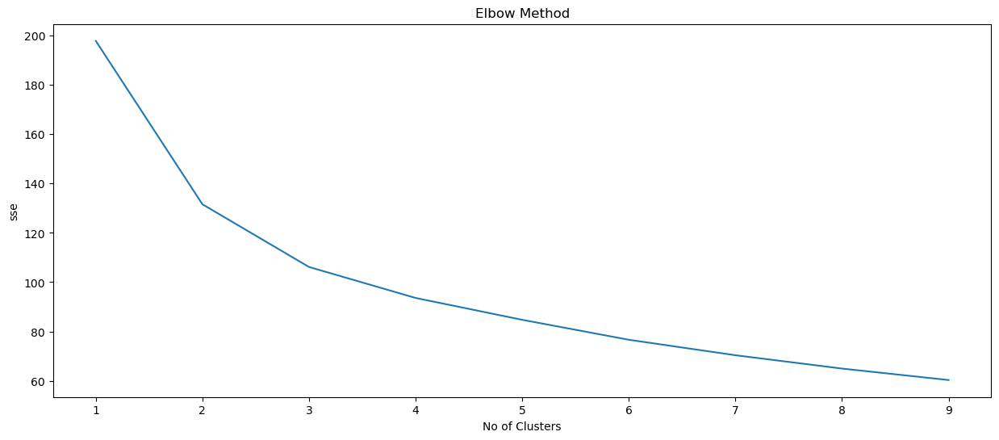

In [64]:
# Using elbow method to determine the numbers of clusters

plt.figure(figsize=(15,6))
plt.plot(k_rng, sse)
plt.title('Elbow Method')
plt.xlabel('No of Clusters')
plt.ylabel('sse')

plt.show()

As per the task description we are asked to do 3 clusters. It is obvious from the elbow chart that the best choice for number of clusters is k=3.

# 4.1 Creating Clusters

In [65]:
# Fitting K-Means clustering

km = KMeans(n_clusters=3, random_state=12)

cluster = km.fit_predict(df_new)
cluster

array([0, 0, 0, ..., 2, 2, 2])

In [66]:
pd.value_counts(cluster)

2    5804
0    2325
1     277
dtype: int64

In [67]:
df['cluster'] = cluster
df

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,cluster
0,ANDHRA PRADESH,ADILABAD,2001,8603,55,18,0,454,0
1,ANDHRA PRADESH,ANANTAPUR,2001,8692,127,14,66,356,0
2,ANDHRA PRADESH,CHITTOOR,2001,12445,114,2,0,456,0
3,ANDHRA PRADESH,CUDDAPAH,2001,6498,100,4,0,278,2
4,ANDHRA PRADESH,EAST GODAVARI,2001,14107,89,14,0,475,0
...,...,...,...,...,...,...,...,...,...
8401,DAMAN & DIU,DAMAN,2012,463,0,0,7,6,2
8402,DAMAN & DIU,DIU,2012,78,0,0,1,2,2
8403,LAKSHADWEEP,LAKSHADWEEP,2012,127,0,0,0,2,2
8404,PUDUCHERRY,KARAIKAL,2012,1663,1,0,7,11,2


# 4.2  Create DataFrame for each cluster that shows data according to the areas

## 1. Sensitive Area's

In [68]:
Sensitive_areas = df[cluster==1]

Sensitive_areas.head()

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,cluster
131,GUJARAT,AHMEDABAD COMMR.,2001,30762,46,0,77,774,1
239,KARNATAKA,BANGALORE COMMR.,2001,60993,94,7,6,639,1
289,MADHYA PRADESH,BHOPAL,2001,28928,185,66,102,609,1
302,MADHYA PRADESH,INDORE,2001,28968,38,99,115,583,1
351,MAHARASHTRA,MUMBAI,2001,69775,11,0,159,673,1


## 2. Moderate Area's

In [69]:
Moderate_areas = df[cluster==0]

Moderate_areas.head()

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,cluster
0,ANDHRA PRADESH,ADILABAD,2001,8603,55,18,0,454,0
1,ANDHRA PRADESH,ANANTAPUR,2001,8692,127,14,66,356,0
2,ANDHRA PRADESH,CHITTOOR,2001,12445,114,2,0,456,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,14107,89,14,0,475,0
6,ANDHRA PRADESH,GUNTUR,2001,16954,141,35,0,758,0


## 3. Peaceful Area's

In [70]:
Peaceful_areas = df[cluster==2]

Peaceful_areas.head()

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,cluster
3,ANDHRA PRADESH,CUDDAPAH,2001,6498,100,4,0,278,2
5,ANDHRA PRADESH,GUNTAKAL RLY.,2001,736,0,0,0,1,2
19,ANDHRA PRADESH,SECUNDERABAD RLY.,2001,1174,0,0,0,2,2
20,ANDHRA PRADESH,SRIKAKULAM,2001,5395,44,0,0,219,2
22,ANDHRA PRADESH,VIJAYAWADA RLY.,2001,906,2,0,0,3,2


In [71]:
Sensitive_areas.drop(['cluster'],axis=1, inplace=True)
Moderate_areas.drop(['cluster'],axis=1, inplace=True)
Peaceful_areas.drop(['cluster'],axis=1, inplace=True)

# 4.3  Analyse your clusters and prepare a report that explains all your observations

In [72]:
# Summation of all crimes

Sensitive_areas['OVERALL CRIME'] = Sensitive_areas.iloc[:,3:].sum(axis=1)
Sensitive_areas.sort_values(by='OVERALL CRIME', ascending=False, inplace=True)

Sensitive_areas.head()

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,OVERALL CRIME
6575,MAHARASHTRA,MUMBAI COMMR.,2010,81447,27,1,532,1286,83293
5142,MAHARASHTRA,MUMBAI COMMR.,2008,78919,31,1,364,1404,80719
7308,MAHARASHTRA,MUMBAI COMMR.,2011,78719,30,2,425,1509,80685
5731,KARNATAKA,BANGALORE COMMR.,2009,76825,92,1,6,770,77694
3061,MAHARASHTRA,MUMBAI,2005,75166,17,1,303,1152,76639


In [73]:
# Top 10 STATES/UT and DISTRICTS which have highest overall crime number in the Sensitive Areas

Sensitive_areas.nlargest(n=10, columns=['OVERALL CRIME'])

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,OVERALL CRIME
6575,MAHARASHTRA,MUMBAI COMMR.,2010,81447,27,1,532,1286,83293
5142,MAHARASHTRA,MUMBAI COMMR.,2008,78919,31,1,364,1404,80719
7308,MAHARASHTRA,MUMBAI COMMR.,2011,78719,30,2,425,1509,80685
5731,KARNATAKA,BANGALORE COMMR.,2009,76825,92,1,6,770,77694
3061,MAHARASHTRA,MUMBAI,2005,75166,17,1,303,1152,76639
6453,KARNATAKA,BANGALORE COMMR.,2010,75522,100,1,18,902,76543
5852,MAHARASHTRA,MUMBAI COMMR.,2009,74864,22,4,369,1218,76477
3748,MAHARASHTRA,MUMBAI COMMR.,2006,74180,27,0,380,1098,75685
8057,MAHARASHTRA,MUMBAI COMMR.,2012,72311,28,1,517,1621,74478
4443,MAHARASHTRA,MUMBAI COMMR.,2007,72985,21,2,278,1168,74454


In [76]:
# Summation of all crimes

Moderate_areas['OVERALL CRIME'] = Moderate_areas.iloc[:,3:].sum(axis=1)
Moderate_areas.sort_values(by='OVERALL CRIME', ascending=False, inplace=True)

Moderate_areas.head()

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,OVERALL CRIME
941,KERALA,ERNAKULAM,2002,32544,56,1,14,392,33007
4868,BIHAR,PATNA,2008,30835,236,6,38,455,31570
271,KERALA,ERNAKULAM,2001,31008,41,1,13,374,31437
959,MADHYA PRADESH,BHOPAL,2002,30073,382,48,26,561,31090
4608,TAMIL NADU,COIMBATORE RURAL,2007,29864,196,0,2,390,30452


In [77]:
# Top 10 STATES/UT and DISTRICTS which have highest overall crime number in the Moderate Areas

Moderate_areas.nlargest(n=10, columns=['OVERALL CRIME'])

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,OVERALL CRIME
941,KERALA,ERNAKULAM,2002,32544,56,1,14,392,33007
4868,BIHAR,PATNA,2008,30835,236,6,38,455,31570
271,KERALA,ERNAKULAM,2001,31008,41,1,13,374,31437
959,MADHYA PRADESH,BHOPAL,2002,30073,382,48,26,561,31090
4608,TAMIL NADU,COIMBATORE RURAL,2007,29864,196,0,2,390,30452
2531,TAMIL NADU,CHENNAI,2004,28202,4,0,12,471,28689
3480,BIHAR,PATNA,2006,27393,37,9,8,446,27893
2693,ANDHRA PRADESH,CYBERABAD,2005,26640,159,21,12,1055,27887
7,ANDHRA PRADESH,HYDERABAD CITY,2001,26571,79,2,25,991,27668
1177,TAMIL NADU,CHENGAI,2002,27039,20,0,7,268,27334


In [80]:
# Summation of all crimes

Peaceful_areas['OVERALL CRIME'] = Peaceful_areas.iloc[:,3:].sum(axis=1)
Peaceful_areas.sort_values(by='OVERALL CRIME', ascending=False, inplace=True)

Peaceful_areas.head()

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,OVERALL CRIME
8239,TAMIL NADU,KANCHIPURAM,2012,16664,9,0,1,74,16748
1885,TAMIL NADU,VELLORE,2003,15361,3,0,0,141,15505
508,TAMIL NADU,CHENGAI,2001,15031,10,0,1,167,15209
4614,TAMIL NADU,KANCHIPURAM,2007,14883,20,0,0,111,15014
5318,TAMIL NADU,KANCHIPURAM,2008,14244,14,0,12,79,14349


In [83]:
# Top 10 STATES/UT and DISTRICTS which have highest overall crime number in the Peaceful Areas

Peaceful_areas.nlargest(n=10, columns=['OVERALL CRIME'])

,STATE/UT,DISTRICT,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,OVERALL CRIME
8239,TAMIL NADU,KANCHIPURAM,2012,16664,9,0,1,74,16748
1885,TAMIL NADU,VELLORE,2003,15361,3,0,0,141,15505
508,TAMIL NADU,CHENGAI,2001,15031,10,0,1,167,15209
4614,TAMIL NADU,KANCHIPURAM,2007,14883,20,0,0,111,15014
5318,TAMIL NADU,KANCHIPURAM,2008,14244,14,0,12,79,14349
1615,KERALA,ERNAKULAM COMMR.,2003,14166,15,1,9,154,14345
2289,KERALA,ERNAKULAM COMMR.,2004,14023,8,0,3,164,14198
2539,TAMIL NADU,KANCHIPURAM,2004,14019,26,0,0,145,14190
3251,TAMIL NADU,VELLORE,2005,13459,23,0,6,140,13628
3221,TAMIL NADU,CUDDALORE,2005,13435,29,0,0,153,13617


## 1. What is impacting more crimes in sensitive areas

In [85]:
# Correlation for the Sensitive Areas

cor_s=Sensitive_areas.corr()
cor_s

,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,OVERALL CRIME
YEAR,1.000000,-0.115628,-0.102499,-0.235742,0.130350,0.240791,-0.104351
TOTAL IPC CRIMES,-0.115628,1.000000,-0.232594,-0.268823,-0.036631,0.098277,0.998962
TOTAL CRIMES AGAINST SC,-0.102499,-0.232594,1.000000,0.496465,-0.097047,-0.086204,-0.228642
TOTAL CRIMES AGAINST ST,-0.235742,-0.268823,0.496465,1.000000,-0.006666,-0.125662,-0.268630
TOTAL CRIMES AGAINST CHILDREN,0.130350,-0.036631,-0.097047,-0.006666,1.000000,-0.101696,-0.034647
TOTAL CRIMES AGAINST WOMEN,0.240791,0.098277,-0.086204,-0.125662,-0.101696,1.000000,0.142410
OVERALL CRIME,-0.104351,0.998962,-0.228642,-0.268630,-0.034647,0.142410,1.000000


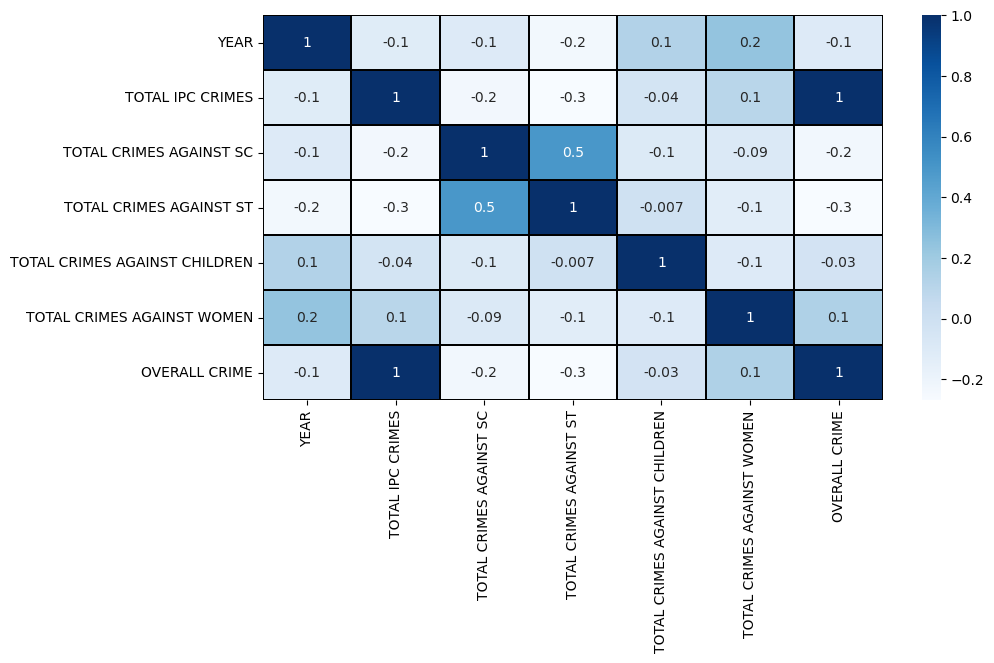

In [90]:
# Visualization the Correlation for Sensitive Areas

plt.figure(figsize=(10,5))
sns.heatmap(Sensitive_areas.corr(), linewidths=0.1,fmt='.1g',linecolor='black', annot = True, cmap = 'Blues')
plt.yticks(rotation=0);
plt.show()

From the correlation heatmap we can make the following observations:
    
   - There is high possitive correlation (1) between Overall Crimes and Total IPC Crimes, which means the Total IPC Crimes have very high impact on the Overall Crimes.
   - There is low possitive correlation between Overall crimes and Total Crimes against Women.
   - There is negative correlation between Overall Crimes and Year, Total Crimes against SC, Total Crimes against ST and Total Crimes against Children.
   - There is low possitive correlation between Year and Total Crimes against Children and Total Crimes against Women. Which means this type of crimes are increasing slightly with the year.

In [92]:
Sensitive_areas.describe()

,YEAR,TOTAL IPC CRIMES,TOTAL CRIMES AGAINST SC,TOTAL CRIMES AGAINST ST,TOTAL CRIMES AGAINST CHILDREN,TOTAL CRIMES AGAINST WOMEN,OVERALL CRIME
count,277.000000,277.000000,277.000000,277.000000,277.000000,277.000000,277.000000
mean,2008.122744,29361.155235,115.064982,18.252708,173.487365,1083.032491,30750.992780
std,3.230194,16156.580702,114.259412,26.899862,117.341957,745.592141,16208.573943
min,2001.000000,7415.000000,0.000000,0.000000,0.000000,263.000000,8442.000000
25%,2006.000000,17973.000000,22.000000,0.000000,95.000000,586.000000,19429.000000
50%,2009.000000,24891.000000,82.000000,5.000000,156.000000,828.000000,26082.000000
75%,2011.000000,34990.000000,176.000000,27.000000,226.000000,1355.000000,36581.000000
max,2012.000000,81447.000000,554.000000,164.000000,575.000000,4556.000000,83293.000000


The highest impact on the number of Overall Crimes has Total IPC Crimes, which makes the highest percentige from the Overall Crimes compared with the other types of crimes. Total Crimes againstWomen also have significant impact on the Overall Crimes.

IPC Crimes which have been included in our original dataset df_ipc (01_District_wise_crimes_committed_IPC_2001_2012.csv) are:

MURDER, ATTEMPT TO MURDER, CULPABLE HOMICIDE NOT AMOUNTING TO MURDER, RAPE, CUSTODIAL RAPE, OTHER RAPE, KIDNAPPING & ABDUCTION, KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS, KIDNAPPING AND ABDUCTION OF OTHERS, DACOITY, PREPARATION AND ASSEMBLY FOR DACOITY, ROBBERY, BURGLARY, THEFT, AUTO THEFT, OTHER THEFT, RIOTS, CRIMINAL BREACH OF TRUST, CHEATING, COUNTERFIETING, ARSON, HURT/GREVIOUS HURT, DOWRY DEATHS, ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY, INSULT TO MODESTY OF WOMEN, CRUELTY BY HUSBAND OR HIS RELATIVES, IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES, CAUSING DEATH BY NEGLIGENCE, OTHER IPC CRIMES.

All these type of crimes have the highest impact on the number of the overall crimes.


Factors contributing to these types of crimes lead to more complex problems:
    
- Socioeconomic Conditions: Poverty, unemployment and lack of access to education and resources can contribute to higher crime rates in the sensitive areas.

- Urbanization and Population Density: Rapid urbanization can lead to overcrowding in cities, which can contribute to higher crime rates. Overpopulation can also lead to competition for resources and conflicts.

- Political Factors: Corruption.

- Social Factors: Cultural norms, discrimination, and social inequality can influence crime rates. Marginalized communities may be more vulnerable to exploitation and victimization.

- Infrastructure: such as lack of street lighting or surveillance, can create opportunities for criminal activities to occur.

- Law Enforcement Response: The effectiveness and efficiency of law enforcement agencies in addressing crime can also impact crime rates. 

The consequences from the crimes:
    
- Victims and Families: Victims of crimes often suffer physical, emotional, and financial harm. The impact can range from physical injuries to psychological trauma, leading to long-term effects such as anxiety, depression. Families of victims may also experience emotional distress.

- Community Safety:  High crime rates can create a climate of fear, affecting residents' quality of life.

- Economic Costs: Crime imposes significant economic costs on society, including direct expenses related to law enforcement and criminal justice proceedings.

- Social Disruption: Hate crimes, communal violence, and caste-based discrimination can deepen social divisions.

## 2. What needs to be done to reduce crime. 

Reducing the crimes needs approach that addresses root causes, strengthens community, and promotes proactive interventions. Strategies like the following can be taken:

- Education and Awareness: Education and awareness campaigns can help individuals understand their rights and responsibilities under the law. Increasing literacy rate, promoting tolerance and respect and raising awareness about the consequences of criminal behavior can help prevent the crimes.

- Strengthen Social Support Systems: Investing in social support systems such as healthcare, education and social services, can address underlying factors that contribute to crime such as poverty, unemployment and abuse. Providing access to mental health services, vocational training, and social welfare programs can help individuals at risk.

- Community Engagement: Building strong community relationships can reduce the crimes and promote adequate action against criminal behavior. Community initiatives, neighborhood watch programs and youth activities can empower residents to take ownership of their safety and work together to address local concerns.

- Improve Law Enforcement and Justice System: This includes recruiting and training competent and ethical law enforcement officers, improving access to justice for all communities and promoting transparency and accountability in legal proceedings.

- Improve Socioeconomic Conditions: Promoting economic development, job creation, affordable housing, and access to education can reduce the likelihood of individuals turning to crime out of desperation.

## 3. Most safe and unsafe districts.

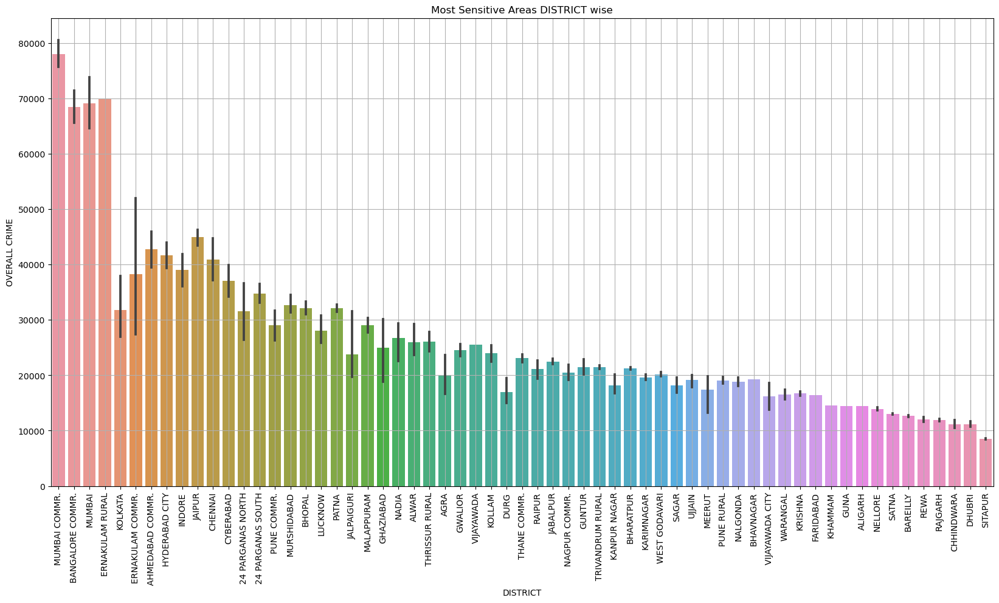

In [96]:
# Plotting the graph DISTRICT vs OVERALL CRIME

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='DISTRICT', y='OVERALL CRIME', data=Sensitive_areas)

plt.xlabel('DISTRICT')
plt.title('Most Sensitive Areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

The 5 most unsafe Districts in the Sensitive Area are Mumbai Commr, Ernakulam Rural, Mumbai, Bangalore Commr and Japur.

The 5 most safe Districts in the Sensitive Area are Sitapur, Dhubri, Chhindwara, Rajgarh, Rewa.

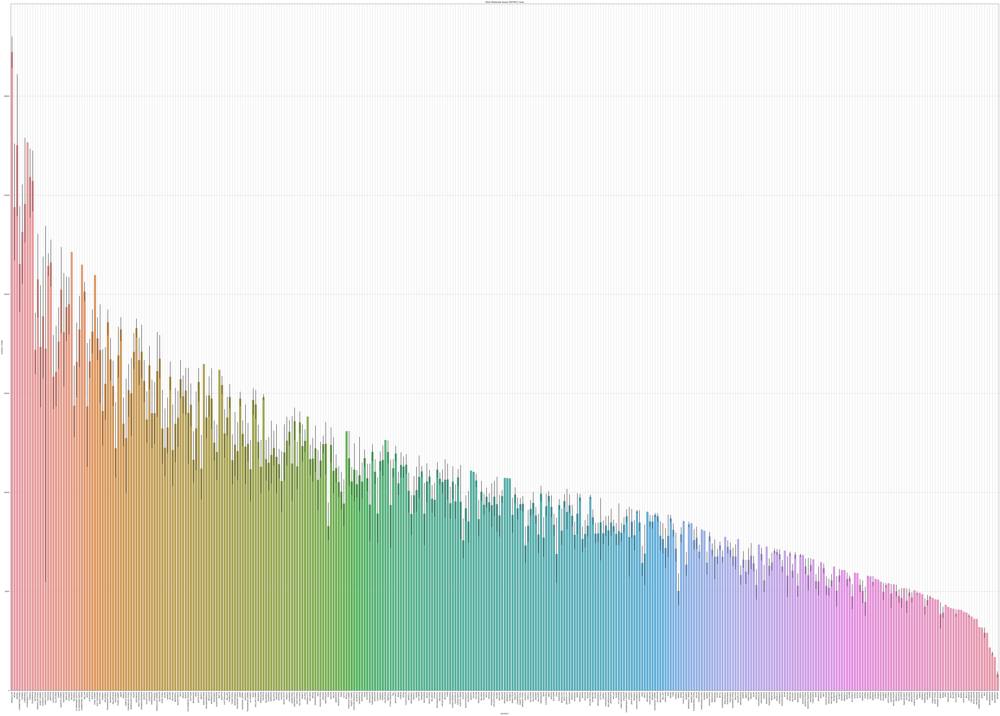

In [97]:
# Plotting the graph DISTRICT vs OVERALL CRIME

plt.figure(figsize=(100,70),facecolor='white')

sns.barplot(x='DISTRICT', y='OVERALL CRIME', data=Moderate_areas)

plt.xlabel('DISTRICT')
plt.title('Most Moderate Areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

The 5 most unsafe Districts in the Moderate Area are Ernakulam, Bhopal, Hyderabad City, Chengai and Trivandrum.

The 5 most safe Districts in the Moderate Area are Kohima, Balrampur, Nuapada, Nowrangpur and Sheopur.

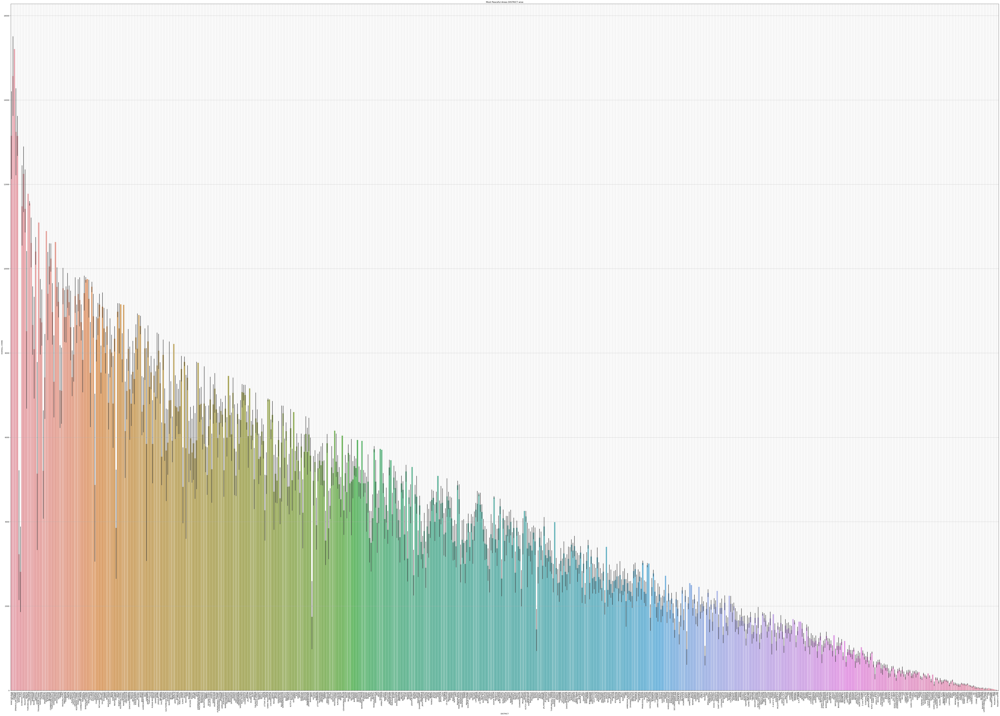

In [98]:
# Plotting the graph DISTRICT vs OVERALL CRIME

plt.figure(figsize=(100,70),facecolor='white')

sns.barplot(x='DISTRICT', y='OVERALL CRIME', data=Peaceful_areas)

plt.xlabel('DISTRICT')
plt.title('Most Peaceful Areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

The 5 most unsafe Districts in the Peaceful Area are Chengai, Vellore, Ernakulam Commr., Cuddalore and Kanchipuram.

The 5 most safe Districts in the Peaceful Area are Railways Katra, CID, Railways KMR, Bieo, Railways Jammu.

## 4. Etc.......Anything that you observe (If you want, you can plot various graphs to analyze)"

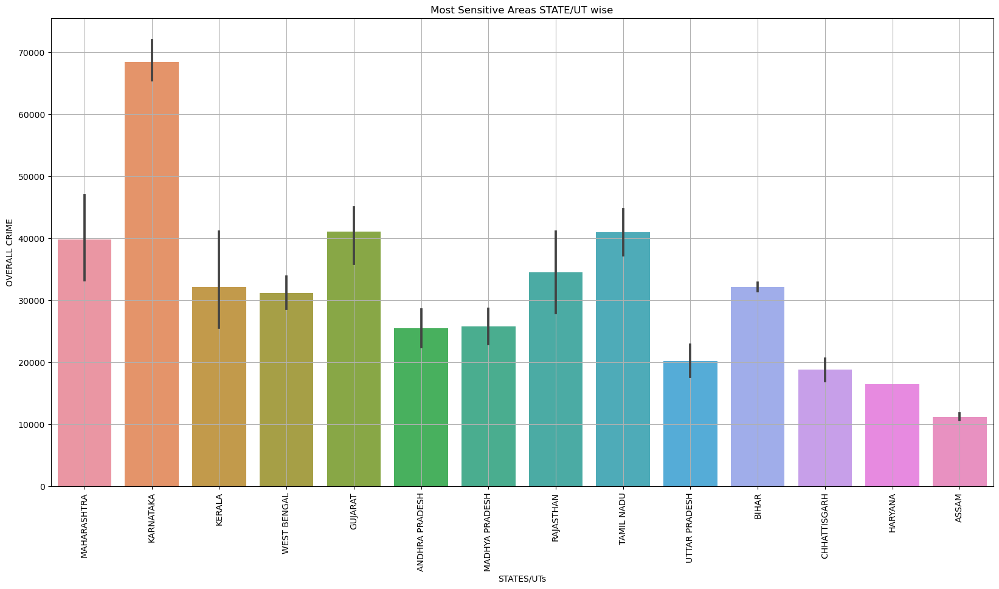

In [99]:
# Plotting the graph overall STATE/UT vs OVERALL CRIME in the Sensitive Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='OVERALL CRIME', data=Sensitive_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Sensitive Areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

In the Sensitive Areas the States with the highest number overall crimes is Karnataka, followed by Gujarat and Tamil Nadu.

The safest States are Assam, Haryana and Chhattisgarh.

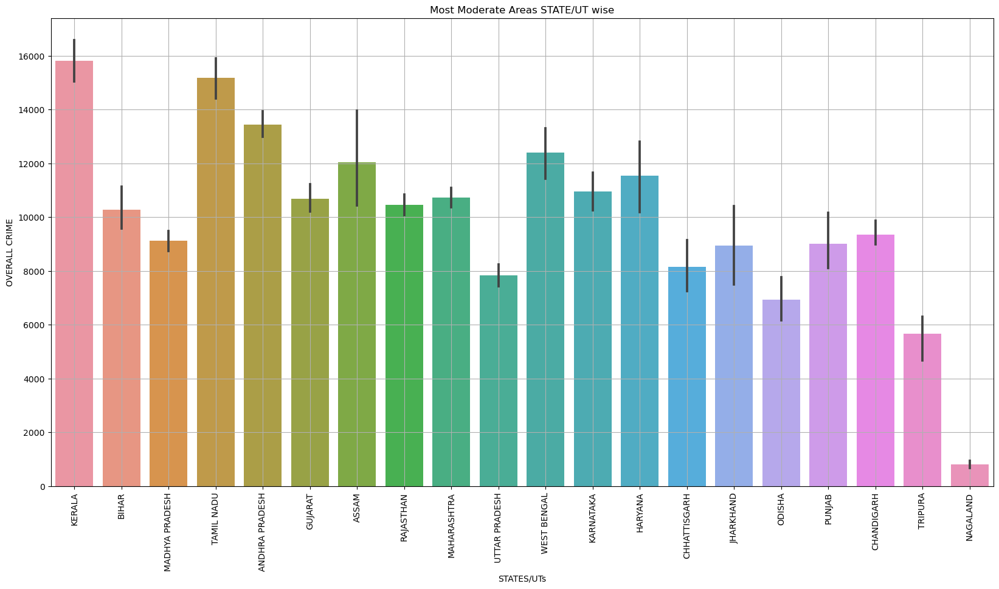

In [100]:
# Plotting the graph overall STATE/UT vs OVERALL CRIME in the Moderate Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='OVERALL CRIME', data=Moderate_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Moderate Areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

Kerala is the state with the highest number of Overall crimesin the Moderate Areas, followed by Tamil Nadu and Andhra Pradesh.

The safest State is Nagaland.

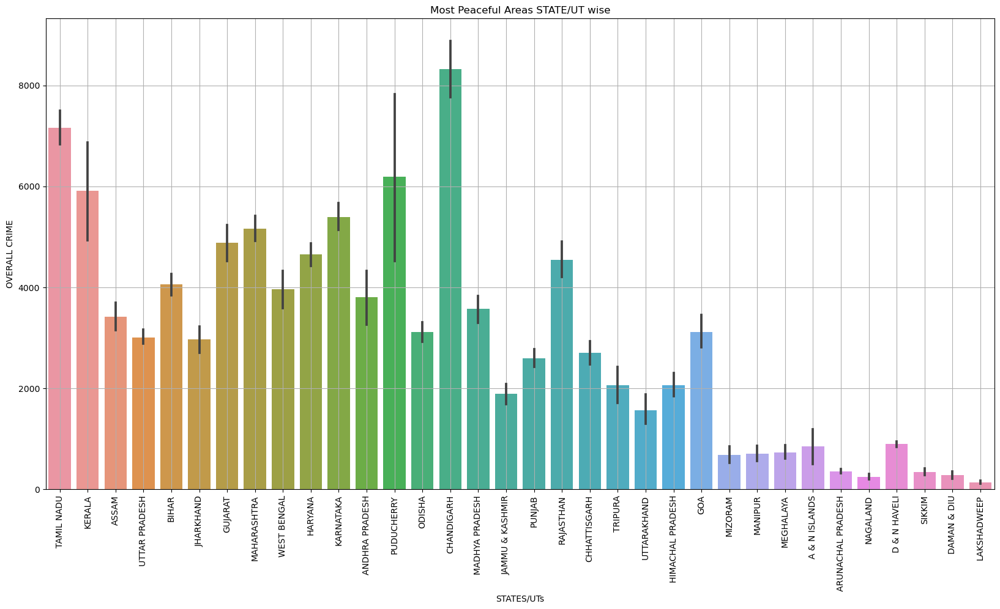

In [101]:
# Plotting the graph overall STATE/UT vs OVERALL CRIME in the Peaceful Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='OVERALL CRIME', data=Peaceful_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Peaceful Areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

Chandigarh is the state with the highest with highest number of overall crimes in the Peaceful Area, followed by Tamil Nadu and Puducherry.

The safest States are Lakshadweep, Nagaland, Daman & Diu, Sikkim and Arunachal Pradesh.

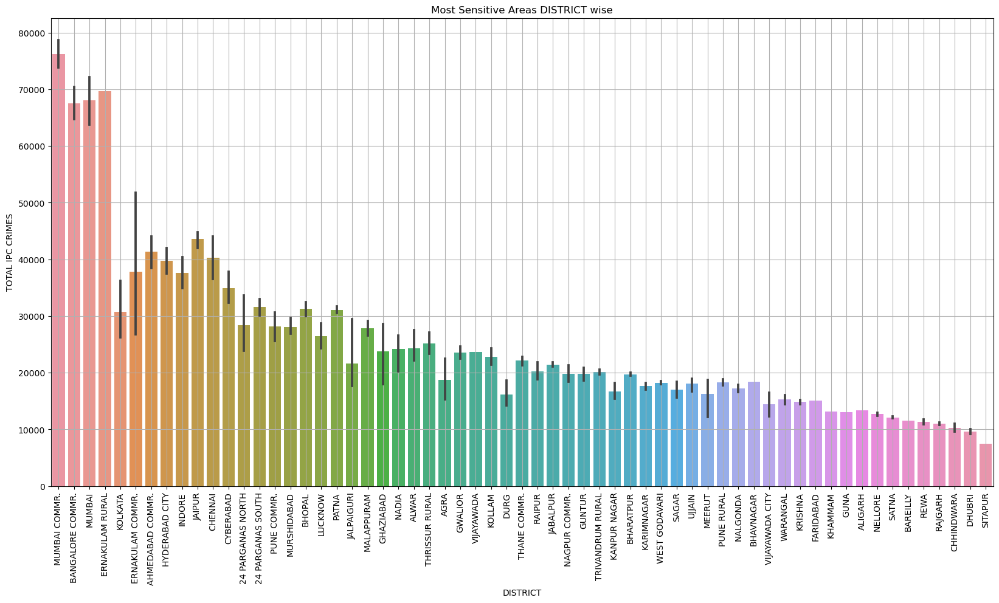

In [114]:
# Plotting the graph DISTRICT vs TOTAL IPC CRIMES  for the Sensitive Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL IPC CRIMES', data=Sensitive_areas)

plt.xlabel('DISTRICT')
plt.title('Most Sensitive Areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

The top 5 Districts with the highest number of reported IPC Crimes in the Sensitive Area are Mumbai Commr.,Ernakulam Rural, Mumbai, Bengalore Commr. and Japur.

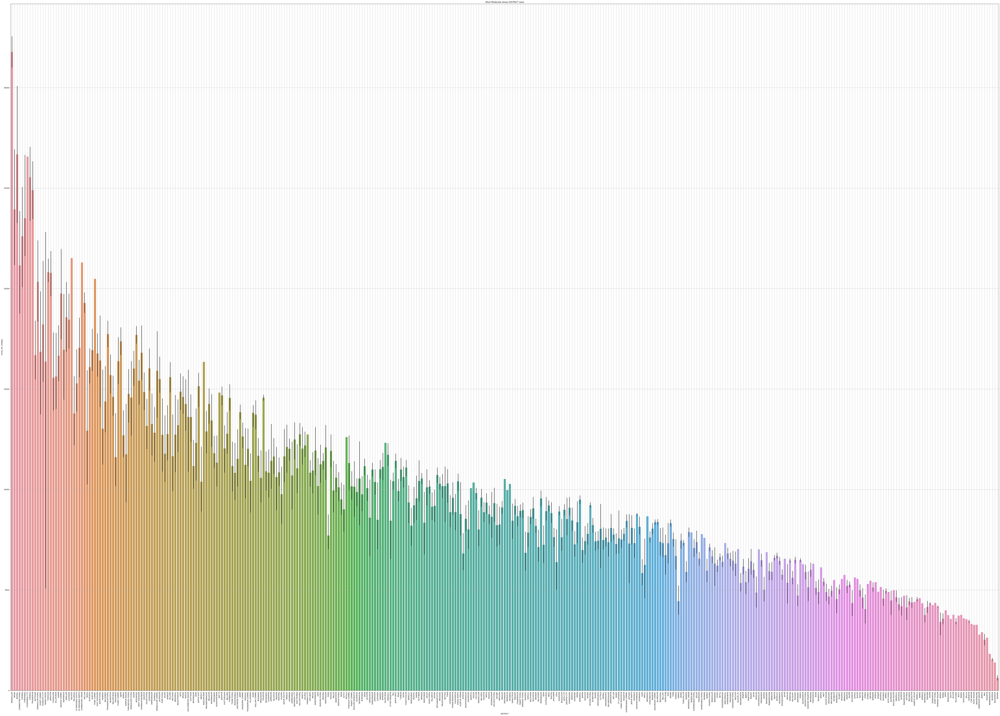

In [108]:
# Plotting the graph DISTRICT vs TOTAL IPC CRIMES for the Moderate Area

plt.figure(figsize=(100,70),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL IPC CRIMES', data=Moderate_areas)

plt.xlabel('DISTRICT')
plt.title('Most Moderate Areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

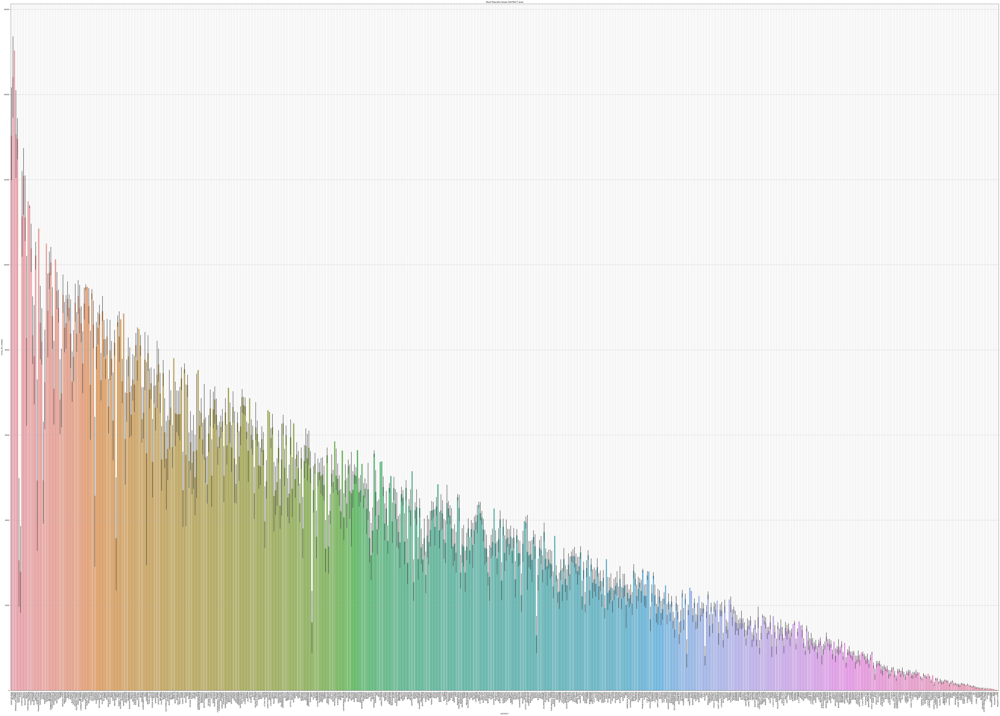

In [115]:
# Plotting the graph DISTRICT vs TOTAL IPC CRIMES for Peaceful area

plt.figure(figsize=(100,70),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL IPC CRIMES', data=Peaceful_areas)

plt.xlabel('DISTRICT')
plt.title('Most Peaceful Areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

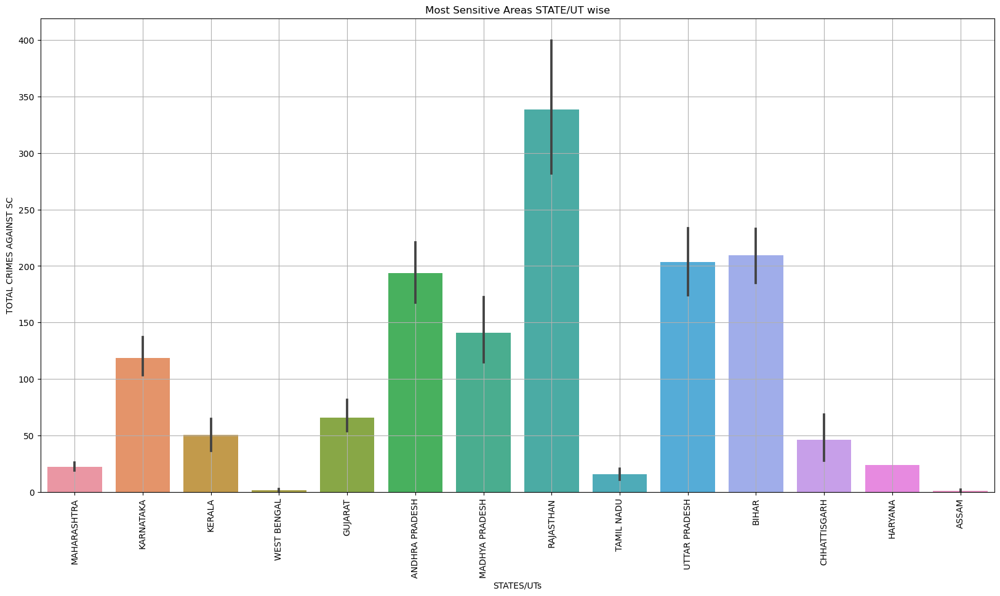

In [116]:
# Plotting the graph overall STATE/UT vs TOTAL CRIMES AGAINST SC in the Sensitive Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='TOTAL CRIMES AGAINST SC', data=Sensitive_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Sensitive Areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

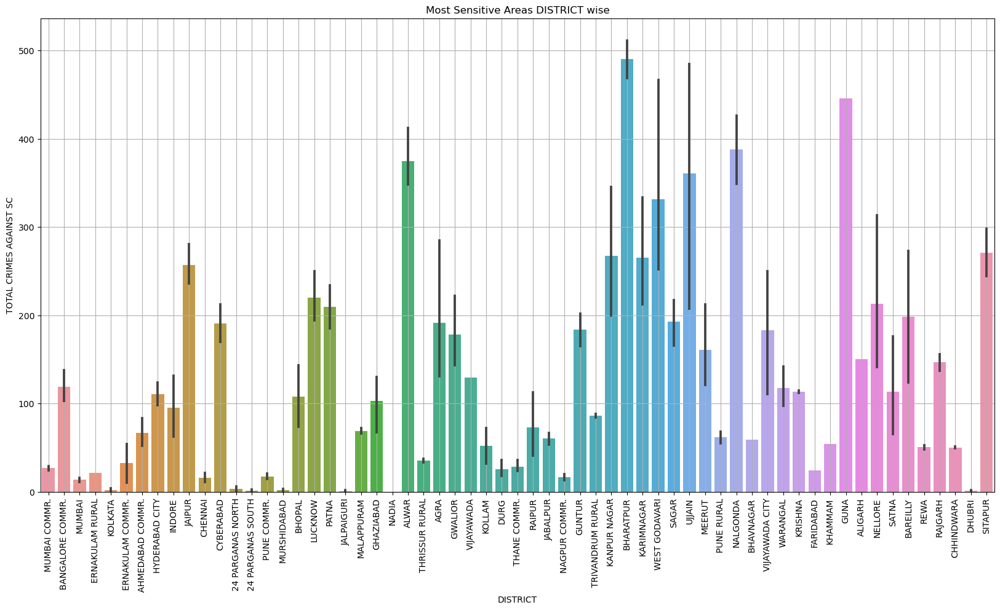

In [118]:
# Plotting the graph DISTRICT vs TOTAL CRIMES AGAINST SC  for the Sensitive Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL CRIMES AGAINST SC', data=Sensitive_areas)

plt.xlabel('DISTRICT')
plt.title('Most Sensitive Areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

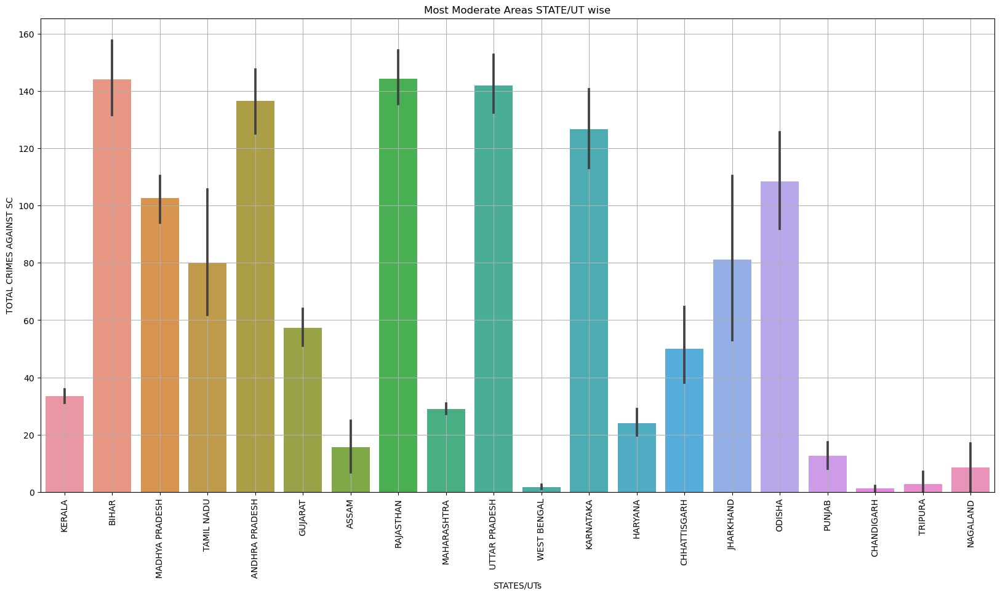

In [117]:
# Plotting the graph overall STATE/UT vs TOTAL CRIMES AGAINST SC in the Moderate Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='TOTAL CRIMES AGAINST SC', data=Moderate_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Moderate Areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

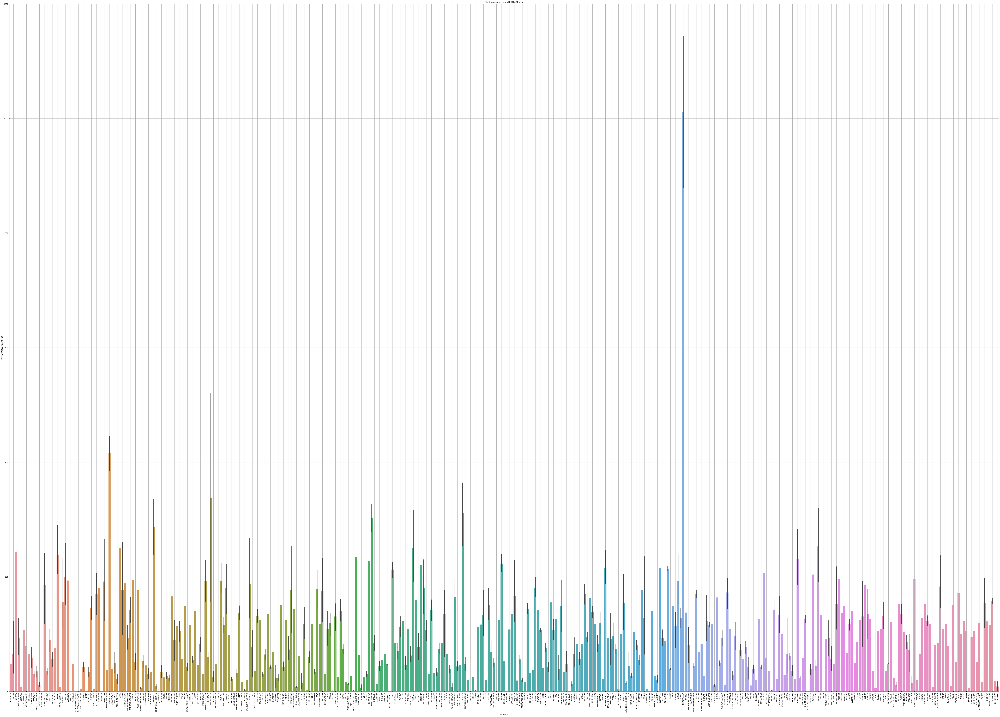

In [120]:
# Plotting the graph DISTRICT vs TOTAL CRIMES AGAINST SC  for the Moderate_areas

plt.figure(figsize=(100,70),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL CRIMES AGAINST SC', data=Moderate_areas)

plt.xlabel('DISTRICT')
plt.title('Most Moderate_areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

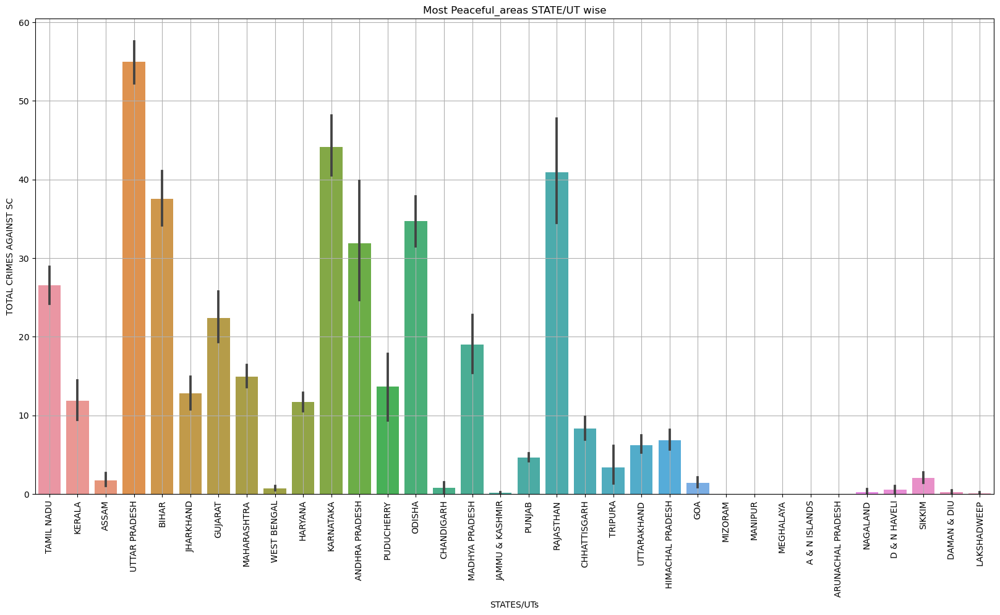

In [121]:
# Plotting the graph overall STATE/UT vs TOTAL CRIMES AGAINST SC in the Peaceful areas

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='TOTAL CRIMES AGAINST SC', data=Peaceful_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Peaceful_areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

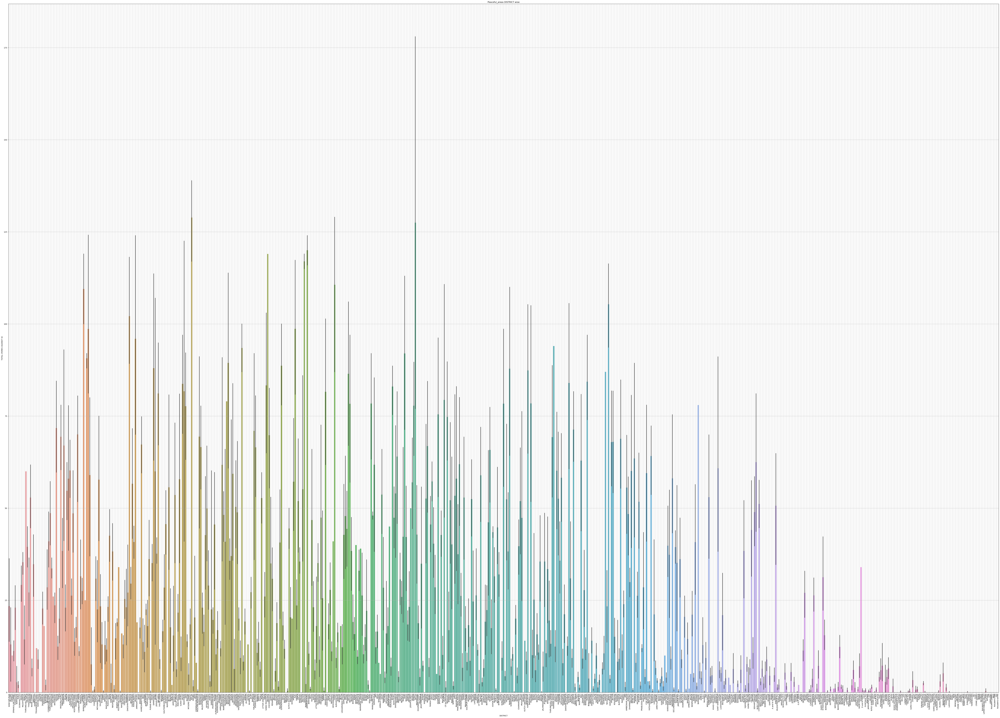

In [122]:
# Plotting the graph DISTRICT vs TOTAL CRIMES AGAINST SC  for the Peaceful_areas

plt.figure(figsize=(100,70),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL CRIMES AGAINST SC', data=Peaceful_areas)

plt.xlabel('DISTRICT')
plt.title('Peaceful_areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

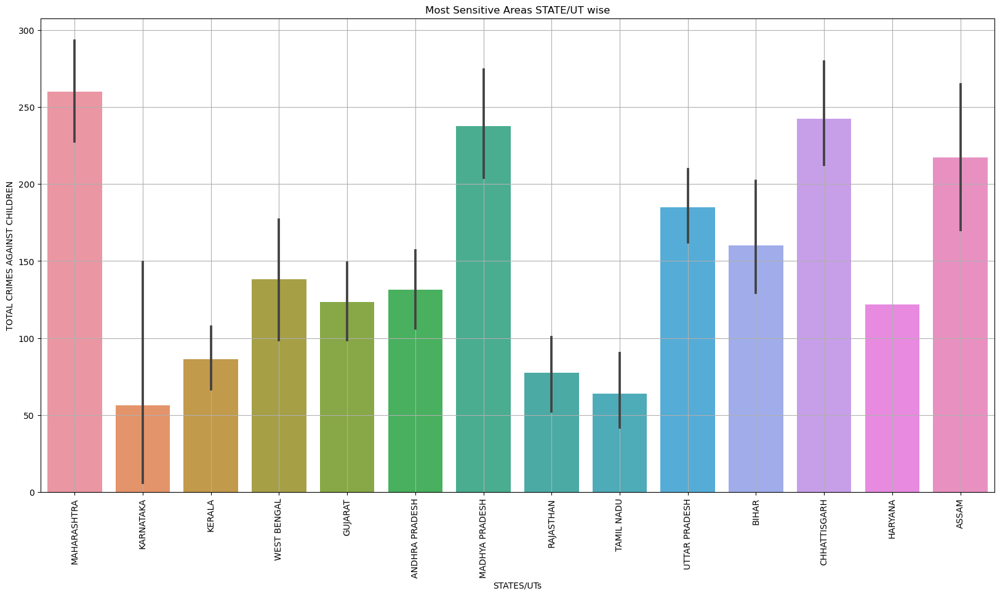

In [123]:
# Plotting the graph overall STATE/UT vs TOTAL CRIMES AGAINST CHILDREN in the Sensitive Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='TOTAL CRIMES AGAINST CHILDREN', data=Sensitive_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Sensitive Areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

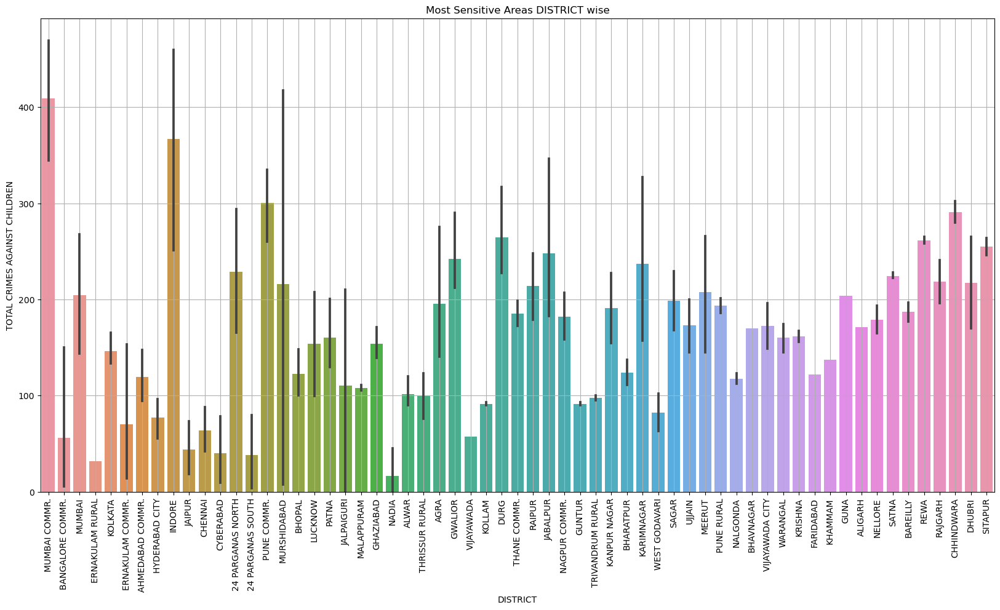

In [124]:
# Plotting the graph DISTRICT vs TOTAL CRIMES AGAINST CHILDREN  for the Sensitive Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL CRIMES AGAINST CHILDREN', data=Sensitive_areas)

plt.xlabel('DISTRICT')
plt.title('Most Sensitive Areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

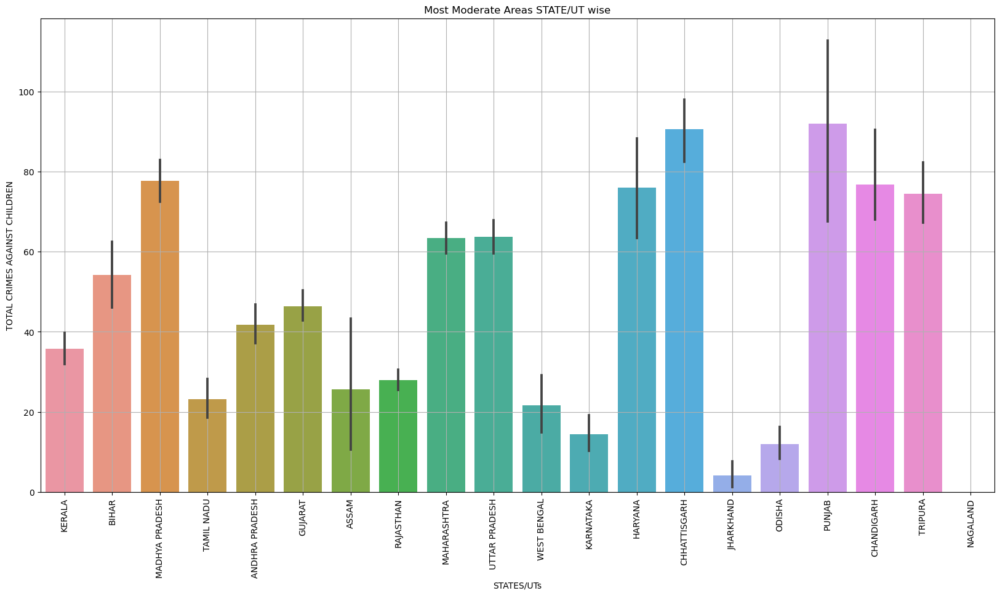

In [125]:
# Plotting the graph overall STATE/UT vs TOTAL CRIMES AGAINST CHILDREN in the Moderate Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='TOTAL CRIMES AGAINST CHILDREN', data=Moderate_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Moderate Areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

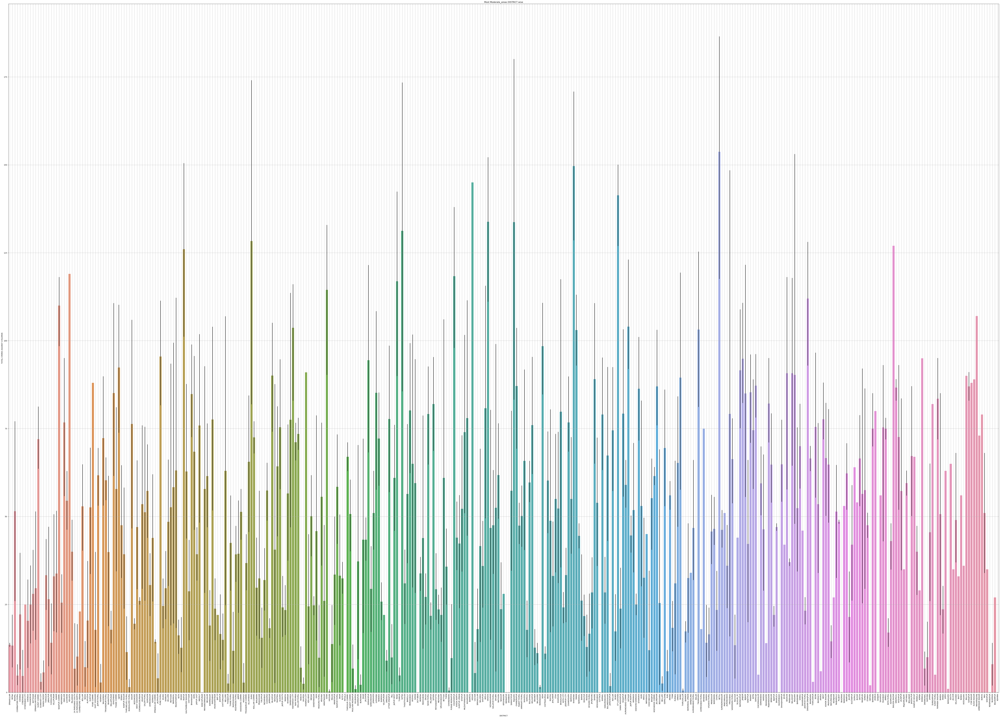

In [126]:
# Plotting the graph DISTRICT vs TOTAL CRIMES AGAINST CHILDREN  for the Moderate_areas

plt.figure(figsize=(100,70),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL CRIMES AGAINST CHILDREN', data=Moderate_areas)

plt.xlabel('DISTRICT')
plt.title('Most Moderate_areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

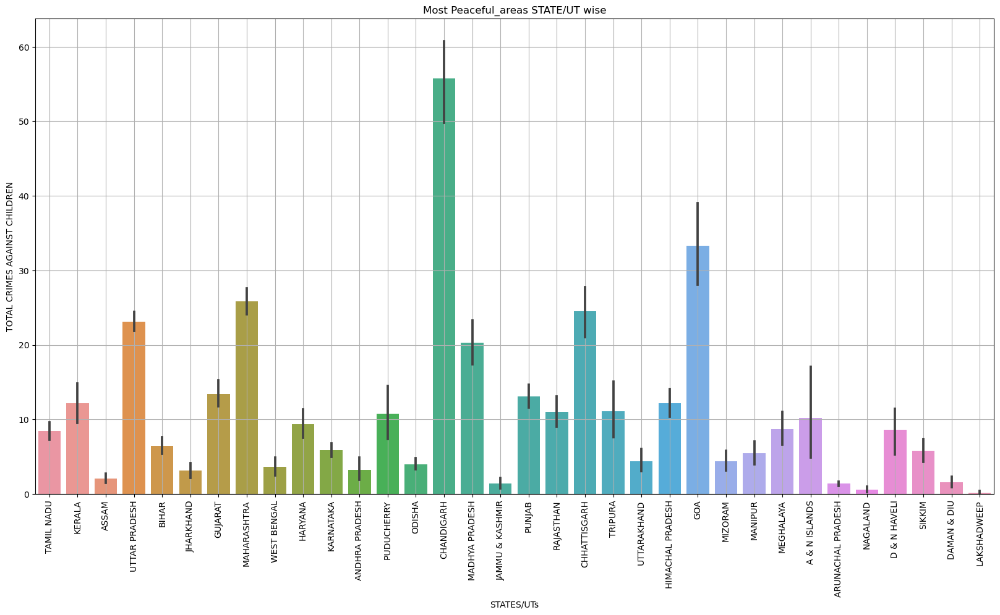

In [127]:
# Plotting the graph overall STATE/UT vs TOTAL CRIMES AGAINST CHILDREN in the Peaceful areas

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='TOTAL CRIMES AGAINST CHILDREN', data=Peaceful_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Peaceful_areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

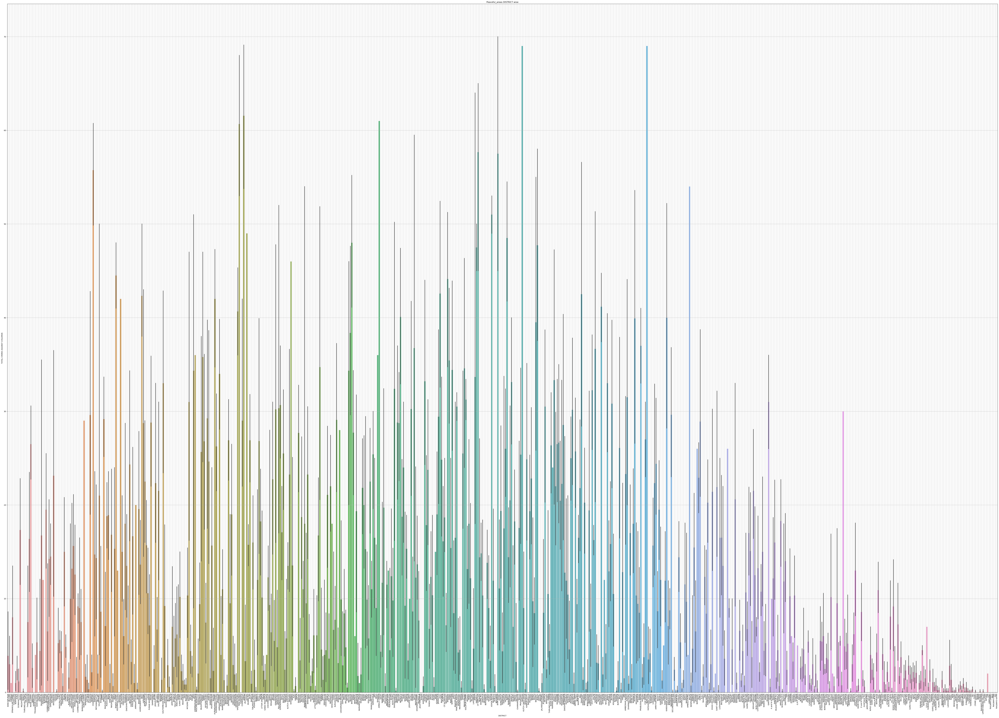

In [128]:
# Plotting the graph DISTRICT vs TOTAL CRIMES AGAINST CHILDREN  for the Peaceful_areas

plt.figure(figsize=(100,70),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL CRIMES AGAINST CHILDREN', data=Peaceful_areas)

plt.xlabel('DISTRICT')
plt.title('Peaceful_areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

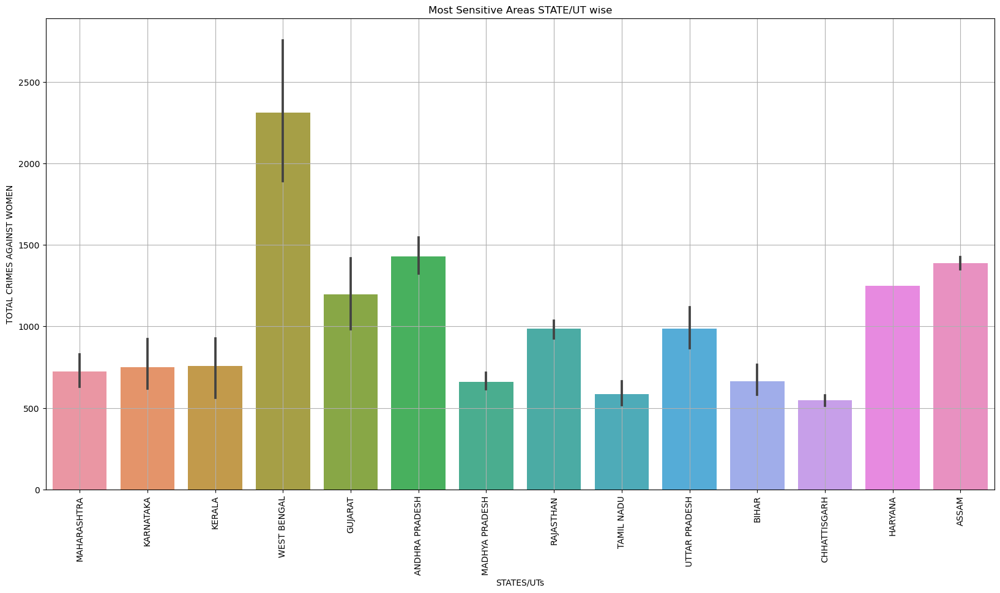

In [129]:
# Plotting the graph overall STATE/UT vs TOTAL CRIMES AGAINST WOMEN in the Sensitive Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='TOTAL CRIMES AGAINST WOMEN', data=Sensitive_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Sensitive Areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

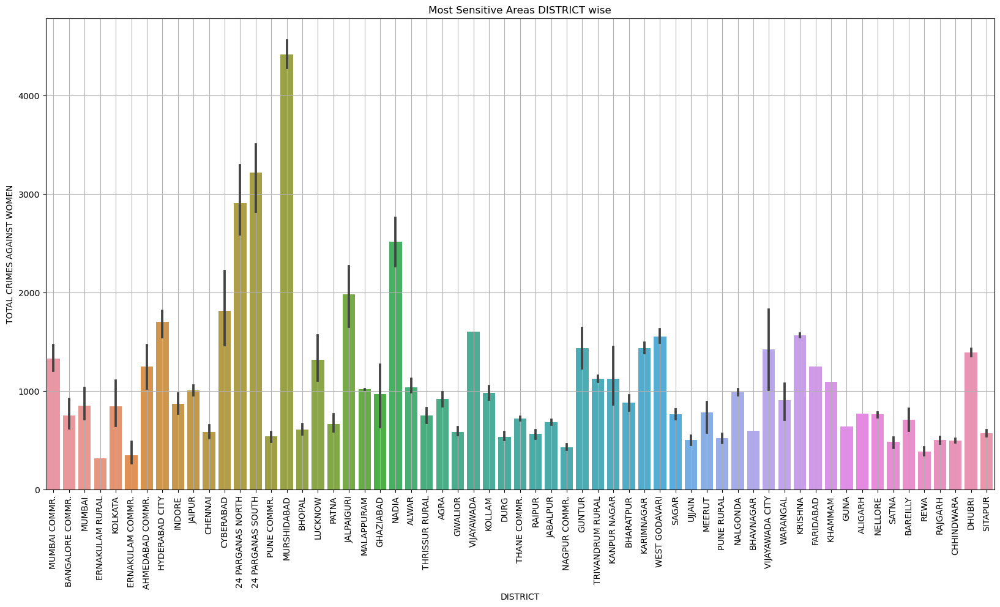

In [132]:
# Plotting the graph DISTRICT vs TOTAL CRIMES AGAINST WOMEN  for the Sensitive Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL CRIMES AGAINST WOMEN', data=Sensitive_areas)

plt.xlabel('DISTRICT')
plt.title('Most Sensitive Areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

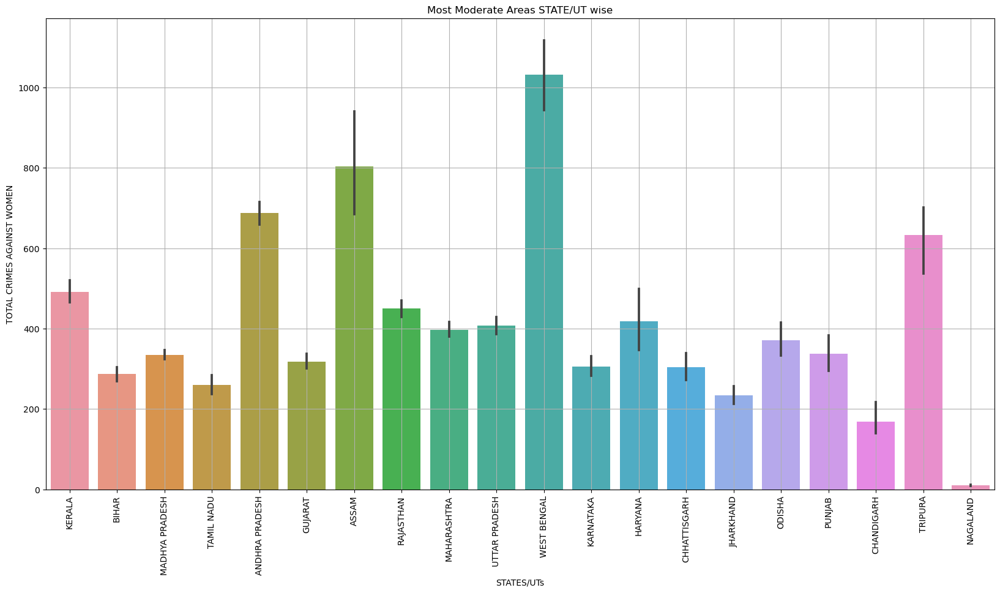

In [133]:
# Plotting the graph overall STATE/UT vs TOTAL CRIMES AGAINST WOMEN in the Moderate Area

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='TOTAL CRIMES AGAINST WOMEN', data=Moderate_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Moderate Areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

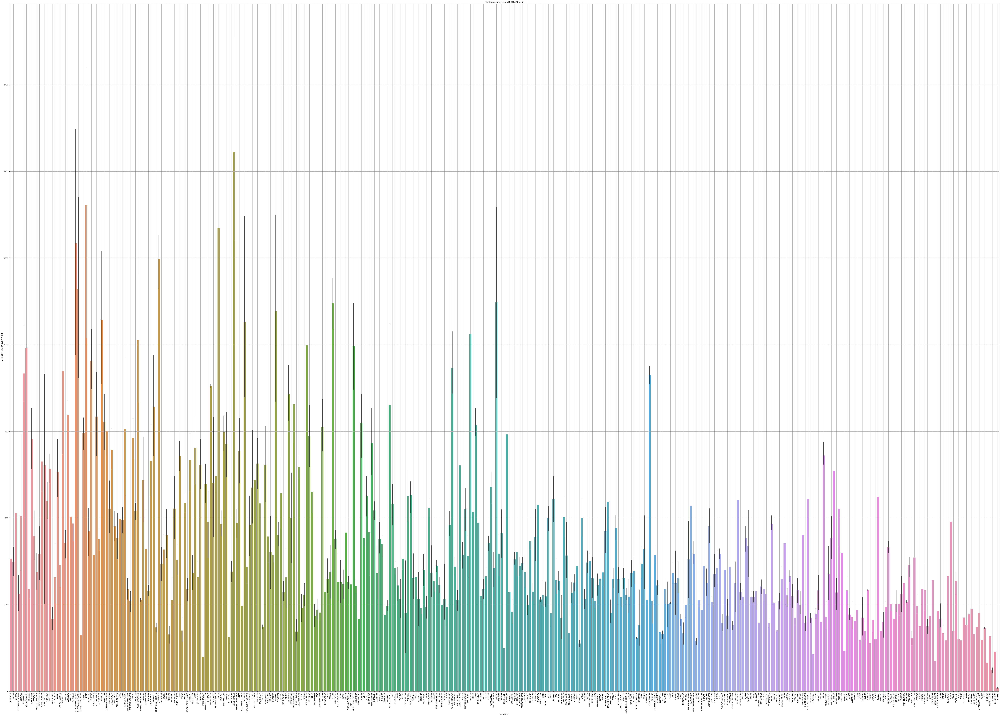

In [134]:
# Plotting the graph DISTRICT vs TOTAL CRIMES AGAINST WOMEN  for the Moderate_areas

plt.figure(figsize=(100,70),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL CRIMES AGAINST WOMEN', data=Moderate_areas)

plt.xlabel('DISTRICT')
plt.title('Most Moderate_areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

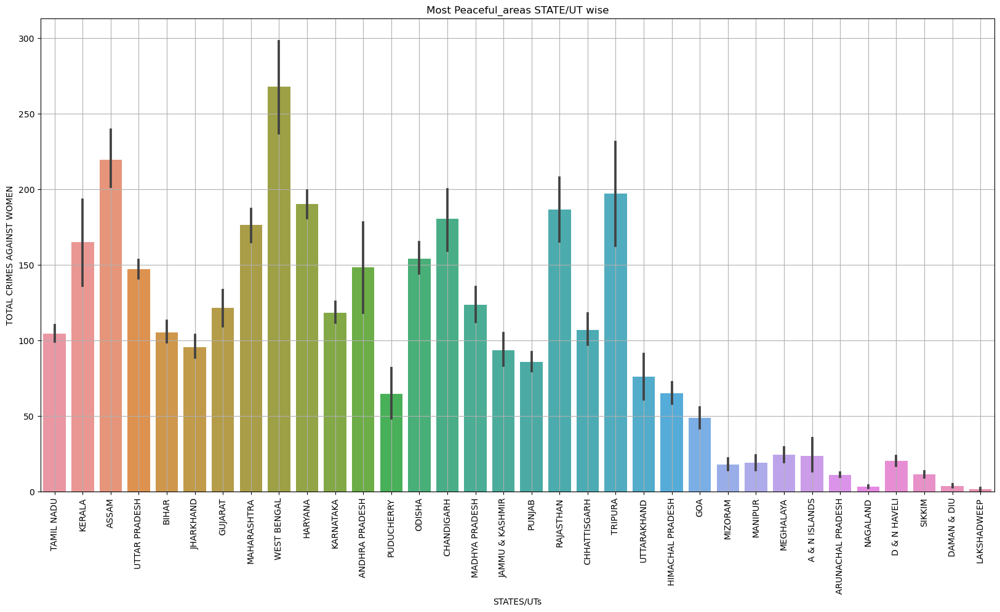

In [135]:
# Plotting the graph overall STATE/UT vs TOTAL CRIMES AGAINST WOMEN in the Peaceful areas

plt.figure(figsize=(20,10),facecolor='white')

sns.barplot(x='STATE/UT', y='TOTAL CRIMES AGAINST WOMEN', data=Peaceful_areas)

plt.xlabel('STATES/UTs')
plt.title('Most Peaceful_areas STATE/UT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

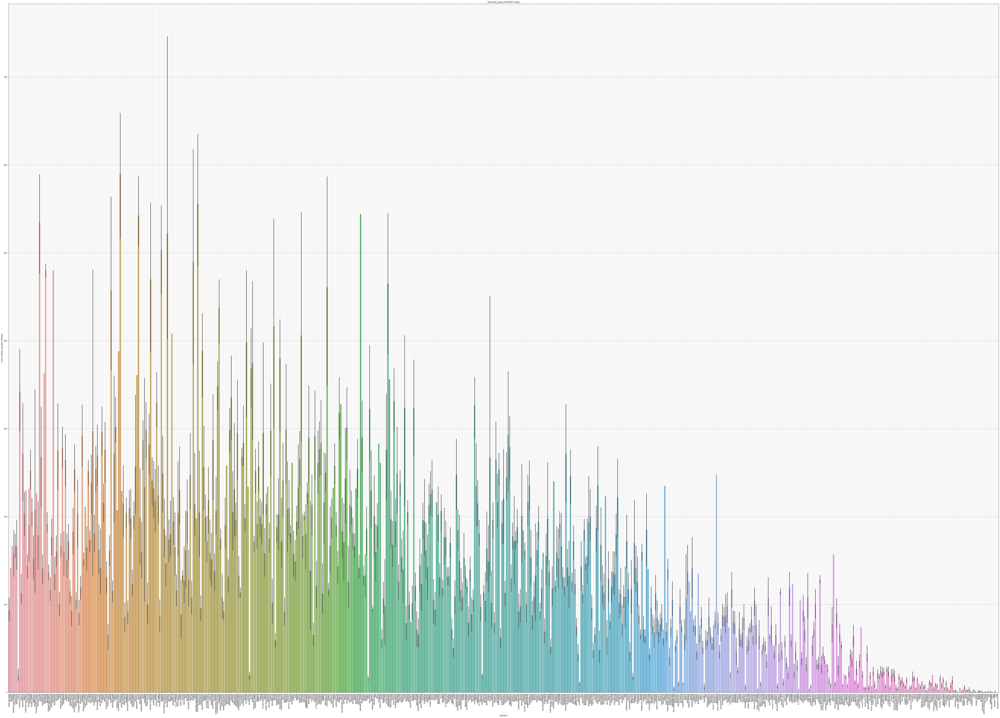

In [136]:
# Plotting the graph DISTRICT vs TOTAL CRIMES AGAINST WOMEN  for the Peaceful_areas

plt.figure(figsize=(100,70),facecolor='white')

sns.barplot(x='DISTRICT', y='TOTAL CRIMES AGAINST WOMEN', data=Peaceful_areas)

plt.xlabel('DISTRICT')
plt.title('Peaceful_areas DISTRICT wise')
plt.xticks(rotation=90, fontsize=10)
plt.grid()

plt.show()

## 4.4   Capstone project overall story in your own words. Min 1000 words.

The overall Story on the Capstone Project is in separate word file in the same folder Phase 4.